# I. Abstract (3 points)

This project explores the effectiveness of various time series forecasting models in predicting COVID-19 new case trends, providing insights into their strengths and weaknesses. The ARIMA and Auto-ARIMA models were effective in capturing short-term linear trends in stationary data but struggled with overfitting. The best results were observed with Prophet Multiple, which effectively utilized multiple seasonality patterns and specific predictors like the reproduction rate, yet failed to accurately capture fluctuations. This project highlighted the importance of data quality and feature engineering in time series analysis. With improved data quality, the model performances improve significantly, as shown using XGBoost and LSTM.

# II. Project and Data Overview (3 points)

## A. Project Overview (1 points)
This project focuses on the prediction of daily new COVID-19 cases in ten European countries. Accurately predicting new cases will allow governments and health organizations to better prepare for and respond to the evolving situation. I will also make comments on understanding of the pandemic's trend, public health policies, and resource allocation. The dataset used is a comprehensive collection of global country-level COVID-19-related data, starting from January 1, 2020, to September 20, 2023. It includes critical variables such as new_cases, new_deaths, and new_vaccinations, which are essential for future predictions. I will conduct country-level analysis to identify regional trends, areas with rising case numbers, and the effectiveness of local health measures, such as lockdowns. 

## B. Data Overview and Preprocessing (2 point)

The dataset in use consists of 67 variables spread across 200 countries, with a total of 342,947 observations over 1359 days (from January 1, 2020, to September 20, 2023).  For this project, the focus was narrowed to European countries, reducing the dataset to 66,493 observations. This subset was further refined by:
1. Filtering countries that reported data daily. Some countries like France reported weekly.
2. Excluding countries with more than 40% missing values in certain features.
3. Adjusting the observation period to focus on data from March 21st, 2020 to January 14th, 2023, due to reduced public attention and data reliability after that.

Test-Train Split

Train set contained data from March 21st, 2020 to December 31st, 2022. Test set contained data from January 1st, 2023 to January 14th, 2023. The split was done to prevents data leakage and accurately reflects the temporal nature of the data. 

Handling Missing Values

There were no missing values in the target variable, new_cases. Only Lithuania had five missing values in the 'reproduction_rate', which were filled with zeros. Poland did not have data for new_tests; other countries are missing ~20% data for new_tests. 
In Poland, the absence of 'new_tests' data was noted, and similar gaps were identified in other countries.
![ ](image-25.png) 
Addressing Multicollinearity

I used  Pearson and Spearman correaltion matrix to determine multicollinearity. Variables containing 'per_hundred|per_thousand|per_million|total|smoothed' had high level of multicollinearity. positive_rate and tests_per_case were highly correlated with new_tests, cardiovasc_rate with human_development_index and life_expectancy, median_age and aged_65_older with aged_70_older, gdp_per_capita and extreme_poverty with human_development_index. Correlations were narrowed to between 0.4 and -0.4 to improve model performance and interpretability.

Feature Engineering

New features were created to capture country-specific elements like holidays with considerations for incubation periods and national lockdowns.
Temporal features like day of the week, weekend, month, year, quarter, day of the year, day of the month, and week of the year were also included. This is particularly helpful for models that struggle with capturing seasonality. There were high number of new_cases in December, January, and July. Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF) analyses were used to identify and create lag features. Lag features included 1day, 7day, and 8day. rolling window 7-day and 14-day were also included.

Stationarity

The Augmented Dickey-Fuller (ADF) test was employed to check for stationarity in the time series data. Countries with stationary data (p<0.05) include Lithunia and Poland. Belgium, Denmark, Finland, Ireland, Italy, Norway, Switzerland, and United Kingdom have non-stationary data. This is particularly useful for developing ARIMA models. 

EDA 

new_cases had left skewed distribution for all countries. I will apoply transformation methods for important for models that assume normality. esuggests that 'new_tests', 'new_deaths', and 'reproduction_rate' are significant predictors for your model. This makes sense as these variables are directly related to the COVID trends. 'New_deaths' can be a lagging indicator of the severity of the pandemic. Features like 'population_density' and 'aged_70_older' are constants for each country and don't vary over time. While these features may not have predictive power for the time series aspect of the model, they are important for understanding cross-sectional differences between countries. For example, economic factors like GDP per capita and poverty rates can affect how a country experiences and responds to the pandemic. 
 ![ ](image-26.png) ![ ](image-27.png) ![ ](image-28.png) ![ ](image-29.png)
 

# III. Methodology (21 points)

## A. ARIMA Model (4 points)

### Data Prepation
The dataset was narrowed down to only use 'date' and 'new_cases' as ARIMA only takes in the target variable. Confirmed there are no missing values in 'new_cases', which is critical since ARIMA models are sensitive to gaps in data. Outliers in 'new_cases' were capped the upperbound of IQR. This minimizes the impact of extreme peaks on the model, which can lead to misleading forecasts. Using the Augmented Dickey-Fuller (ADF) test, I found that data for Lithuania and Poland were already stationary (p < 0.05), while other countries like Belgium, Denmark, Finland, Ireland, Italy, Norway, Switzerland, and the United Kingdom were not. I then applied first-order differencing to the non-stationary series, which subtracting new_cases from the previous value. I then confirmed that all country datasets became stationary using the ADF test. ![ ](image-15.png) 

### Model Building 

The values for p and q were initially chosen based on ACF and PACF plots. However, most of the plots do not have a clear cutoff, which indicates that they do not provide valuable information. The value for d depended on the staionarity of country data. The manually tuned model was iteratively fit to the training data, adjusting parameters to minimize RMSE with considerations for bias-variance trade-off. I used RMSE because it is easy to interpret and penalizes large values. This aligns with my goal to minimize large forecast errors and capture key trends for policy decisions. With a narrower range, I then used grid search to find the best combination of p, d, and q. 

For non-stationary data, I trained a model for Italy.  As shown early, I set d=1 to resolve non-stationarity. The parameters for the best manually tuned model were (5, 1, 3), achieving Train RMSE: 6715.84 and Test RMSE: 9813.37. I then applied grid search with p = q = range(0, 6) and d = range(0, 2). The best model (5, 1, 4) achieved Train RMSE: 5868.79 and Test RMSE: 10262.97. The model achieved optimal AIC but did not achieve a better test performance. Below shows train and test performance for Italy with best manually tuned parameters.
![ ](image-16.png) ![ ](image-19.png)

For stationary data, I trained a model for Poland. Since the ADF test suggested that the data was stationary, I started with d=0. However, the model did not perform well. Changing d to 1 improved model performance significantly. This may indicate that the ADF test did not accurately reflect the stationarity of the data. The parameters for the best manually tuned model were (5, 1, 3), achieving Train RMSE: 1384.38 and Test RMSE: 194.16. The grid search result was again (5, 1, 4), achieving Train RMSE: 1565.39 and Test RMSE: 253.39. One challenge was overfitting, as indicated by the increase in Test RMSE despite a lower Train RMSE and optimal AIC for Italy. The model captures noise in the training data that does not generalize well to unseen data. I then reduced the number of parameters by q to 3. Below shows train and test performance for Poland with best manually tuned parameters.
![ ](image-20.png) ![ ](image-21.png)

### Model Performance
For Italy and Poland, the model captures the trend and the variability very well in training set. In terms of test performance, the model captures variability but tends to overestimate the local maxima. 
(5, 1, 4) was then applied to all countries.  Model performed relatively more strongly for Italy, Poland, and Lithuania but did not capture trend for other countries. The parameters (p, d, q) that work for one country might not be suitable for another. This might be due to overfitting the model to the training data, which doesn't generalize well to other datasets. Since ARIMA is fundamentally a linear model, it may not capture complex nonlinear patterns without transformations or additional seasonal differencing. I would expect to see better performance in Auto ARIMA. 

## B. Auto_ARIMA Model (3 points)

### Data Preparation

I adopted the same data preparation steps for the Auto_ARIMA model as ARIMA and built my model on insights from ARIMA. A different set of parameters were tuned for each country. In addition to p,d,q, Auto_ARIMA can incorporate seasonal terms P, D, and Q, which represent the seasonal aspects of the model, and m, which is the number of periods in each season. Auto_ARIMA conducts a search over specified ranges of model parameters, including p, d, q (and P, D, Q, m for seasonal data), to find the best fit based on AIC. 

### Model Building and Performance
I experimented with both D=0 and D=1. The model for Italy had optimal AIC with (5, 1, 2)  (2, 1, 0, 12) . It uses using two seasonal lags with a period of 12, which can account for incubation period. It also does not use past seasonal forecast errors in predicting future values. The data for each country was differenced once to achieve stationarity and once again for seasonal differences.  The ARIMA model with best performance was for Poland with parameters (5,1,3) with train rmse 1384.381172, and test rmse 194.164547. The Auto-ARIMA model had (5, 1, 4)  (2, 1, 0, 12), train rmse 1507.809701 and test rmse 302.424495. The manually tuned ARIMA model achieves a lower RMSE on both the training and test sets, suggesting it generalizes better to unseen data. It could have been that the seasonal pattern is not strong or consistent year-over-year, and thus inlcuding seasonal parameters led to overfitting. Results are attached in the appendix. 

## C. Prophet (Univariate) Model (3 points)

Compared to the ARIMA family, Prophet can handle multiple seasonality patterns, including yearly, weekly, and daily seasonality. It can also automatically detects change points in the trends, allowing for more flexibility in capturing shifts in the trend. Lastly, it is robust to missing values.

Key parameters included: 
1. growth: 'linear' or 'logistic' to specify the trend flexibility
2. holidays: a dataframe containing holiday dates
3. holidays_prior_scale: controls the flexibility around holiday effects
4. seasonality_prior_scale: controls the strength of the seasonality model
5. changepoint_prior_scale: controls the flexibility of the automatic changepoint selection in the trend component of the model
6. seasonality_mode: An 'additive' model assumes that seasonal effects are the same regardless of the level of the time series, while a 'multiplicative' model assumes that seasonal effects increase proportionally with the time series.
7. changepoint_range: controls the range for which the changepoints are infered. the default value is 0.8, which means  changepoints are only inferred for the first 80% of the time series. This leaves plenty of runway for projecting the trend forward and avoids overfitting fluctuations at the end of the time series.

I first tried developing a model using logistic growth. This is because COVID, rather than increasing infinitely, has a carrying capacity. When forecasting its growth, there is usually some maximum achievable point and the forecast should saturate at this point. For data preparation, I convert the dataset into a two-column format with data and new_cases, which were later renamed as 'ds' and 'y' for model development. I also created a holiday dataframe for each country, including national lockdowns and holidays with a ds_upper of 7 days to account for long incubation period. For outliers, I used the make_future_dataframe function to visualize future trends. The effect of the extreme outliers in 2021 reverberated into the future, shown with the spike on the righ end of the graph. Therefore I tried to set outliers as upper bound of IQR and as NA since Prophet can handle missing values. It turned out that setting missing values to NA had a significant improvement on the performance.
![Alt text](image-8.png)

There was a strong overall and yearly upward trend that lead to model to overestimate number of new cases in test set. For model development, I tried tuning the maximum capacity in order to account for the fact that the population has largely achieved herd population with COVID and thus should not be expecting a surge in cases on a large scale. The cap could not achieve bias variance tradeoff, as shown below. The test rmse was lowered to 5133.39, but the train rmse was significantly sacrificed. I decided to not generalize this model to other countries and to take a different approach.   
![ ](image-9.png) ![ ](image-10.png)![ ](image-11.png)



Since logistic growth did not perform well, I developed a different model by taking log transformation of the target vairable y. This helps to stabilize the variance overtime and mitigate the impact of outliers. I filled the 5 -inf values from transformation to avoid error. Some time series may have multiplicative components (seasonal variations that scale with the value of the variable), and a log transformation can convert the series into an additive model. After manually tuning the parameters mentioned early, I tried optimizing performance using grid search with cross validation (horizon = '14 days', period = '100 days', initial = '365 days'). However, this did not resolve the issue of overfitting. 
The best model parameters were Prophet(
            holidays=holiday_italy,
            holidays_prior_scale = 0.1,
            seasonality_prior_scale = 1,
            changepoint_prior_scale = 0.05,
            seasonality_mode = 'additive'
             ), achieving train RMSE: 19991.57 and test RMSE 17571.55. The model had moderate flexibility in seasonality and small holiday effects. I then applied the model parameters to other countries (see Apendix). The model overestimated the values in most of the countries. The details are in the appendix.
![](image.png) ![ ](image-1.png)
 

## D. Prophet (Multivariate) Model (3 points)

### Data Preparation and Model Development
For data preparation, in addition to taking the steps in Univariate Prophet, log transformation was done on new_death as it had right-skewed distribution and can be an important predictor. In Prophet Multivariate, significant predictors are added to the linear component of the model so that the time series depends on these predictors as either an additive or multiplicative factor. Feature selection was largely based on domain knowledge and findings from exploratory data analysis. While new_tests is highly correlated with new_cases, none of the countries had data on it after July 2021. 'new_deaths' can be a lagging indicator of the severity of the pandemic. reproduction_rate and stringency_index had moderate negative correlation with new_cases. An iterative process was done to choose sigficant predictors. new_deaths led to serious model bias; it may be that the regressor coefficient could not capture the complex relationship between new_deaths and new_cases. As technology progresses, there more better treatment solutions for COVID and lower mortality rate. The only signicant predictor was reproduction_rate. 
Once I figured out the significant regressor, I used grid search to optimize model performance, which produced a similar result. 
The final parameter models included (
            holidays=holiday_italy,
            holidays_prior_scale = 25,
            seasonality_prior_scale = 1,
            changepoint_prior_scale = 0.1,
            seasonality_mode = 'additive'
             ) and reproduction_rate as the additional regressor. 

### Model Performance
For Italy, train rmse was 12509.22 and test RMSE: 7592.08. Prophet multivariate model had both better train and test performance compared to univariate. The reproduction_rate is "quantif[ies] how many new infections a single infectious individual creates in an otherwise completely susceptible population". It is strongly correlated with "passenger air travel, driving, walking, and transit mobility" with a time delay of 17.24±2.00 days model(Linka et al). This number can thus be an effective tool for predicting covid cases. ![ ](image-2.png) ![ ](image-3.png)

## E. XGBoost Model (4 points)

### Data Preparation
Since XGBoost is sensitive to outliers in the target variable, a new variable called y_scaled is created using RobustScaler. Both y and y_scaled will be explored for model development. XGBoost is a tree-based model that uses gradient boosting for predicitons. For time series data, I created features that capture the time-dependent nature of the dataset, including lagged values, rolling window statistics,holidays, and date-time features like day of week or month of year. The list of predictors used includes ['location', 'new_deaths', 'reproduction_rate', 'new_tests',
       'stringency_index', 'population_density', 'aged_70_older',
       'diabetes_prevalence', 'female_smokers', 'life_expectancy',
       'human_development_index', 'population', 'holidays', 'season',
       'day_of_week', 'weekend', 'month', 'year', 'quarter', 'dayofyear',
       'dayofmonth', 'weekofyear', 'new_cases_lag1', 'new_cases_lag7',
       'new_cases_lag8', 'new_cases_roll_mean7', 'new_cases_roll_std7',
       'new_cases_roll_mean14', 'new_cases_roll_std14']. 

### Model Building and Performance
Key Parameters: 
1. learning_rate: Step size shrinkage used to prevent overfitting.
2. max_depth: Maximum depth of the trees.
3. subsample: Fraction of samples to be used for fitting each tree
4. colsample_bytree: Fraction of features used for each tree
5. n_estimators: number of gradient boosting trees
6. reg_lambda: regularizes the model to prevent overfitting

I first developed a model using y_scaled; which largely overestimated the true test values.
![ ](image-4.png) ![ ](image-5.png)

A model was then developed with unscaled y. K-fold cross validation was used to find optimal parameters to address the issue with overfitting. However, it led to more severe overfitting shown by negative values in multiple countries. Early stopping was then attempted to stops building additional trees once it detects that adding more trees does not result in better generalization to unseen data. Using the manually tuned parameters, early_stopping_rounds = 50 had the best performance. 14 trees generated the balanced between training and validation loss. new_cases_lag7 and reproduction_rate were the most significant predictors. The final set of parameter values was (learning_rate=0.3, max_depth = 3, n_estimators=500, reg_lambda = 1, gamma = 100). For Italy, train RMSE was 5972.53 and test RMSE was 10563.16. Results for other countries are included in Appendix. The model fails to capture any trend and variations in the time series data. This can be attributed to the unreliability of the dataset after mid 2022. As noted earlier, all 10 countries stopped reporting new_tests after July 2022. This indicate that the data in use may exhibit high level of uncertainty. The potentially significant predictors may no longer provide useful information. 
![](image-6.png) ![ ](image-14.png)![](image-12.png) ![](image-13.png)


In order to address the issue mentioned early, further models were built on data before July 2022 following the same logic. The train set spanned between March 2020 and April 2022, and the test set May 1st to 14th of 2022. The performance improved significantly across different countries. The model for Italy accurately captured trends and fluctuations in both the train and test set. Feature importance suggests that reproduction rate, new_case_lag7, and new_deaths provided valuable information about new_cases. This reinforces the earlier interpretation that data after July 2022 is highly uncertain and not a reliable dataset for prediction purposes.
![ ](image-22.png) ![ ](image-23.png) ![ ](image-24.png)

## F. LSTM Model (4 points)

### Data Preparation
To start with, columns including population_density, diabetes_prevalence, female_smokers, life_expectancy, human_development_index, aged_70_older, and population are dropped since they are constants and may not have any predictive power. Then, the date column is converted from string format to datetime objects and then to ordinal format. This makes the dates numeric and suitable for model training. Similarly, the season column, initially in string format, is converted to numerical values using a dictionary mapping. Then, to normalize data, RobustScaler from sklearn.preprocessing is used for scaling features. The data is grouped by location, and a scaler is trained on the training set for each country. Then, scaling is applied to each group's train and test set separately, except for the location column. Finally, a custom function make_series is defined to transform the data into a format suitable for time series forecasting with an LSTM.
For each point in time, a 14-day window of data is created, capturing the features up to that day. The target variable (new_cases) is also included. This process results in a series of tuples containing the index, the value of new_cases, and the corresponding feature set.

### Model Building and Performance
Key parameters:
1. number of LSTM units: The number of units in the LSTM layer, with 32 and 64 units being evaluated. More units can provide higher model complexity.
2. batch_size: The number of samples to use for each training iteration.
3. epochs: The number of times to iterate over the entire training dataset.
4. optimizer: The optimizer used to update the weights in the model. Adam is used here.
5. learning_rate: This controls how much the model's weights are updated during training. 
6. early_stopping_patience: The number of epochs with no improvement (validation loss) after which training will be stopped.

To find the best set of parameters, I used grid search over the specified ranges of learning rates, batch sizes, number of LSTM units, and early stopping patience. This exhaustive search explores combinations of parameters to find the best performing model configuration.
For each combination of parameters, a new LSTM model is built with a single LSTM layer and a dense output layer. The model is compiled with the Adam optimizer and Mean Absolute Error (MAE) as the loss function.
The model is trained using the specified number of epochs, batch size, and learning rate, with a validation split of 20% for monitoring performance. Early stopping is employed to halt training if the validation loss does not improve for the specified patience, enhancing efficiency and reducing overfitting.
One challenge was overfitting, as indicated by the increase in Test RMSE despite a lower Train RMSE and optimal AIC for Italy. The model captures noise in the training data that does not generalize well to unseen data. To address this, I tried adding early stopping to halt training if the validation loss does not improve for the specified patience. 


### Model Performance
According to the test visualization, it's clear that the model's predictions follow the trend of the actual data quite closely in many instances, although there are some deviations. For example:
 - In the case of Italy, the predictions capture the overall trend but miss some of the peaks and troughs.
 - For Lithuania, the model fails to predict the sharp spike; this could be due to outliers or events not captured by the model.
 - The Norway graph shows that the model is somewhat effective in capturing the trend, although it smoothens out the peaks and troughs.
 - In the Poland and Switzerland graphs, the model captures the direction of the changes but not the exact values, indicating that the model might benefit from further parameter tuning or additional features that capture more variance.
![ ](image-30.png) ![ ](image-31.png)

Once again, using data prior to July 2022 significantly improves the model's ability to capture trend and fluctuations. However, the robust scaler led to high bias in the train set.
![ ](image-32.png) ![ ](image-33.png)

# IV. Results (5 points)

## A. Model Performance Comparison (3 points)
• Presentation of performance metrics for each model.
• Comparison of results to identify the best-performing model.

ARIMA 
![ ](ARIMA_result.png)

Auto-ARIMA
![ ](AutoARIMA_result.png)

Prophet Single 
![](Prophet_Single_result.png)

Prophet Multiple
![ ](Prophet_Mult_result.png)

XGBoost 
![ ](XGB_result.png)

LSTM 
![ ](LSTM_result.png)

Prophet had the best performance across most of the countries, illustrated with lowest RMSE. Note that the RMSE for LSTM is on a normalized scale and cannot provide accurate information, further discussion will be provided in the next section.

## B. Analysis of Results (2 points)
The ARIMA family effectively captured the trend and fluctuations in most cases. ARIMA is good at capturing linear trends and autocorrelations in stationary data and effectively captures trend and fluctuations in short-term forecasting. However, it requires data to be stationary and does not inherently account for seasonality or external factors. Auto-ARIMA automates the process of model selection but can be more computationally intensive. Since it includes seasonal components, it is more suitable for more complex time series. However, the complexity also creates higher risk of overfitting. 

While Prophet family had low RMSE, the results were highly biased. The models did not effectively capture the fluctuations. This suggests that there are limitations with evaluating model performance solely on RMSE. Although it provides a quick measure of model accuracy in terms of absolute values, it doesn't always convey the complete picture of model performance. Policymakers and healthcare professionals might require models that not only have low overall error but also accurately capture crucial turning points or seasonal effects to effectively take pre-caustions. Prophet single handles multiple seasonality patterns and holiday effects well. It is robust to missing data and shifts in trend. However, it was hard to achieve a balance between bias and variance. The additional regressors in Prophet multiple enhanced its performance. However, certain regressors may seriously bias the predictions. It required very careful feature selection and tuning.  

XGBoost is particularly strong with large complex datasets. It effectly handles non-linear relationships without high risk of overfitting. However, compared to the models that are designed for time series, it requires more feature engineering. While it failed to capture any trends or fluctuations in the selected data, it demonstrated particularly strong performance using data before July 2022. 

LSTM is effective in capturing both longterm dependencies and short-term fluctuations. However, it is prone to overfitting. The test predictions are severely impacted by the downward trend in training data and had various level of bias for different countries.   

The best-performing model was Prophet Multiple. This may be attributed to its ability to handle multiple seasonality patterns and inclusion of reproduction_rate. Nonetheless, it did not effectively capture the fluctuations and only performed well on a relative basis. 

# V. Discussion (4 points)

A major challenge encountered across models was achieving the optimal bias-variance tradeoff. Various approaches, including early stopping and k-fold cross-validation, were employed to prevent overfitting and improve model generalization. However, these efforts did not yield the expected results. The limitations in capturing the fluctuations effectively by models other than ARIMA and Auto ARIMA may stem from the complex and non-linear nature of the pandemic data. Models like Prophet (both univariate and multivariate) and LSTM are theoretically capable of handling such complexities but may require more nuanced feature engineering and parameter tuning to achieve optimal performance. The most important issue was the reliability of the data post-mid 2022. It appears that the changing nature of the pandemic and perhaps shifts in data collection or reporting practices might have led to inconsistencies in the data. As shown earlier, the XGBoost model's performance on data before July 2022 suggests that variables like reproduction_rate and new_deaths were significant predictors. This indicates that with more consistent and reliable data, the performance of models, especially those incorporating multiple regressors, could improve significantly.

It is also crucial to note that while the multivariate models can yield more accurate results, its practical application in real-life scenarios can be limited. This is because significant predictors such as 'new_deaths' and 'reproduction_rate' are typically known after 'new_cases' have already been reported. Consequently, forecasting future cases based on these predictors may not always be possible in real-time decision-making processes. In such contexts, models from the ARIMA family and the Prophet Single model are more practical and effective. Their ability to forecast based solely on past case data makes them strong candidates for real-time predictive analysis in pandemic situations.

This project allowed me to dive into various models for time series forecasting, particularly in a real-world context. The biggest takeaway is that this project highlighted the critical role of data quality in predictive modeling. It offered practical experience in preprocessing techniques like handling outliers and missing values and most importantly, assessing the quality of the data. The project provided valuable experience in selecting appropriate models for different types of data and objectives. Other important skills included team communication and task management. Setting and following project milestones are important for both the quality of the project and the learning experience. 

I liked the real-world application of knowledge learned during the 303 sequence and navigating the field of time series predictions. However, I disliked collaborating with Brian and his detrimental contribution to the team.  

# VI. Conclusion (2 points)
ARIMA and Auto-ARIMA were proficient in capturing overall trend and fluctuations but overfitted to train data. Prophet Multiple emerged as the best model only in terms of absolute value of RMSE. The quality of data, especially post-mid 2022, significantly impacted model performances. This highlights the importance of reliable data in predictive modeling. 

# VII. References (1 point)
Here are your references formatted in MLA style:

1. "Outlier Detection in Time Series." S-AI-F, s-ai-f.github.io/Time-Series/outlier-detection-in-time-series.html#statistical-based-approaches. 

2. "Saturating Forecasts." Prophet Documentation, Facebook, facebook.github.io/prophet/docs/saturating_forecasts.html. 

3. "Autoregressive Integrated Moving Average." Wikipedia, Wikimedia Foundation, en.wikipedia.org/wiki/Autoregressive_integrated_moving_average#Choosing_the_order. 

4. Lizhen0909. "Time Series Analysis with Keras LSTM." GitHub, github.com/Lizhen0909/ts_purchase_redemption/blob/main/6_keras_lstm.ipynb. 

5. Prashant111. "Complete Guide on Time Series Analysis in Python." Kaggle, www.kaggle.com/code/prashant111/complete-guide-on-time-series-analysis-in-python.

6. "A Comprehensive Guide to Time Series Analysis." Analytics Vidhya, www.analyticsvidhya.com/blog/2021/10/a-comprehensive-guide-to-time-series-analysis/. 

7. Brownlee, Jason. "How to Create an ARIMA Model for Time Series Forecasting in Python." Machine Learning Mastery, machinelearningmastery.com/sarima-for-time-series-forecasting-in-python/.

8. Nau, Robert. "ARIMA models for time series forecasting." Duke University, people.duke.edu/~rnau/411arim3.htm.

9. "Real-time tracking of self-reported symptoms to predict potential COVID-19." National Center for Biotechnology Information, U.S. National Library of Medicine, www.ncbi.nlm.nih.gov/pmc/articles/PMC7359536/. 

# VIII. Appendices (1 point)
• Supplementary materials, code snippets, or additional information supporting the findings.

### ARIMA Performance

/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_mo

(14,)
Belgium - Train RMSE: 1080.7501049498394, Test RMSE: 425.30108158327323


/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


(14,)
Denmark - Train RMSE: 192.35670708351986, Test RMSE: 568.4224235877685


/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/statespace/

(14,)
Finland - Train RMSE: 312.45922792843874, Test RMSE: 103.05595485977759


/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


(14,)
Ireland - Train RMSE: 322.829136252814, Test RMSE: 253.7969155064136


/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/statespace/

(14,)
Italy - Train RMSE: 6715.849476466177, Test RMSE: 9813.377705564164
(14,)
Norway - Train RMSE: 102.29934697374175, Test RMSE: 75.52338085449516


/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_mo

(14,)
Switzerland - Train RMSE: 710.7159110205971, Test RMSE: 616.6532011569325
(14,)
United Kingdom - Train RMSE: 3507.295820886162, Test RMSE: 2873.14244789601


/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/s

(14,)
Poland - Train RMSE: 1384.381171955456, Test RMSE: 194.16454700027893


/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/chanelsun/Library/Python/3.9/lib/python/site-packages/statsmodels/base/m

(14,)
Lithuania - Train RMSE: 271.15744229386956, Test RMSE: 216.8733740300311
                 train_rmse    test_rmse
Belgium         1080.750105   425.301082
Denmark          192.356707   568.422424
Finland          312.459228   103.055955
Ireland          322.829136   253.796916
Italy           6715.849476  9813.377706
Norway           102.299347    75.523381
Switzerland      710.715911   616.653201
United Kingdom  3507.295821  2873.142448
Poland          1384.381172   194.164547
Lithuania        271.157442   216.873374


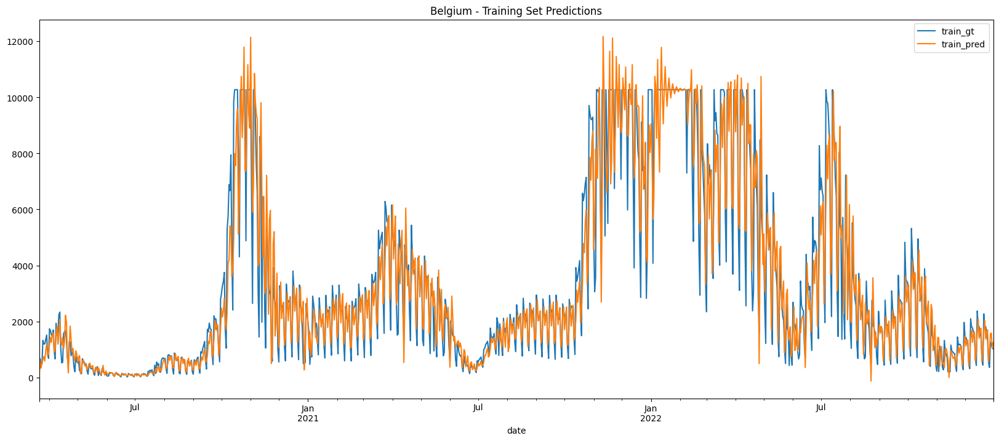

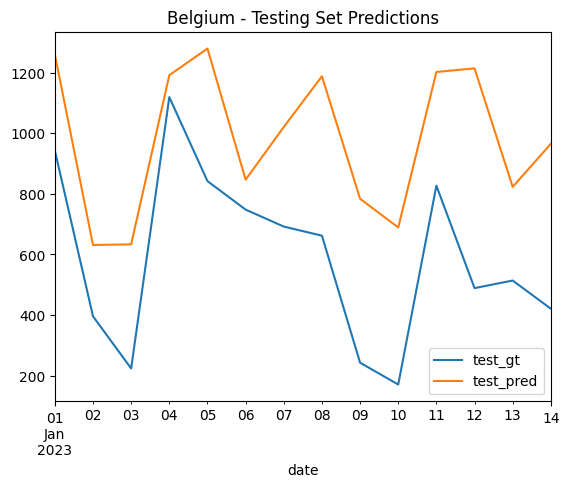

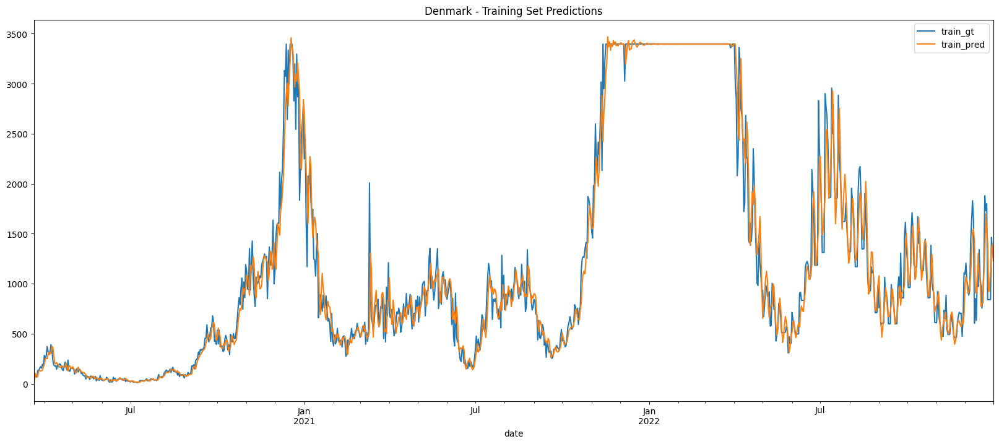

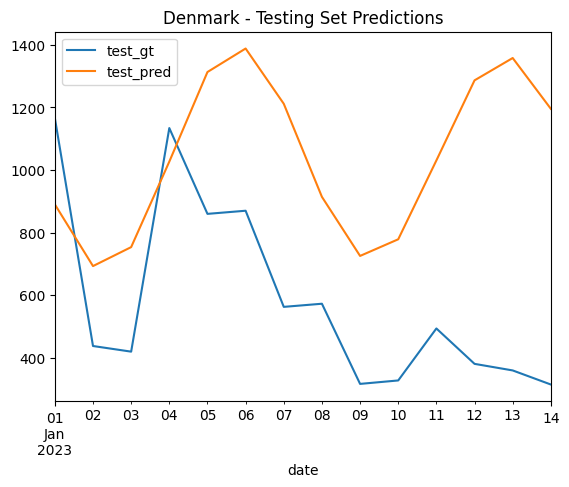

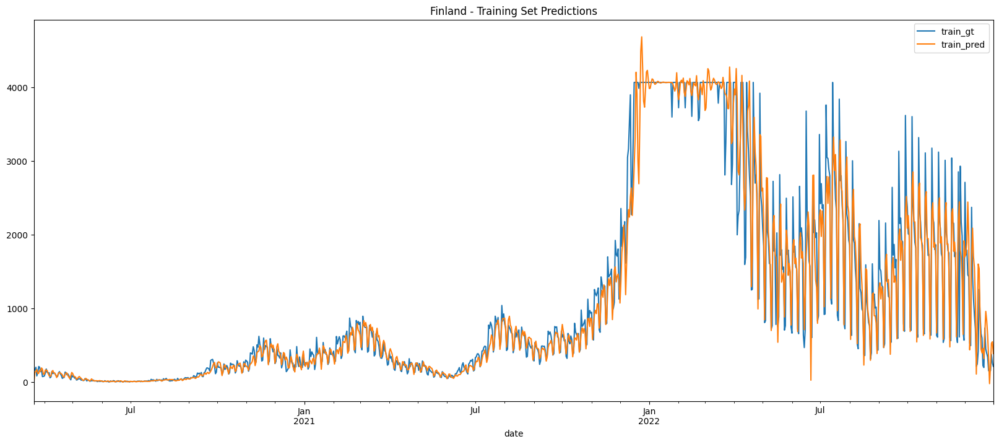

...

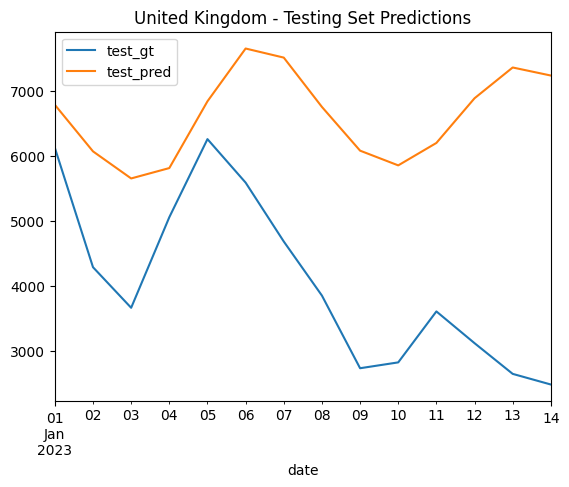

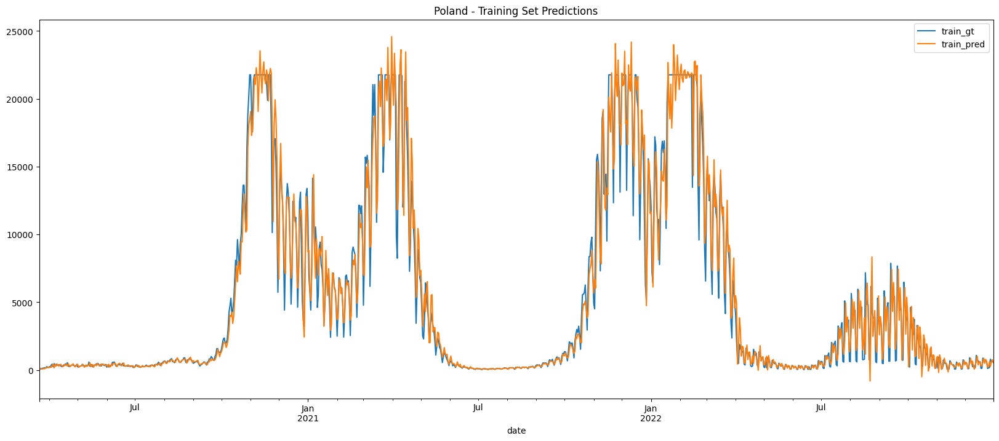

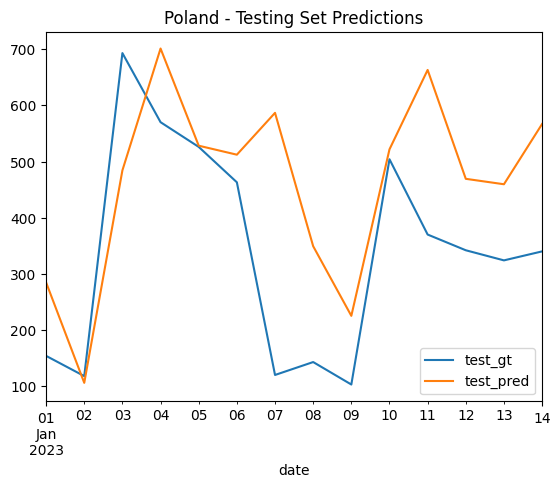

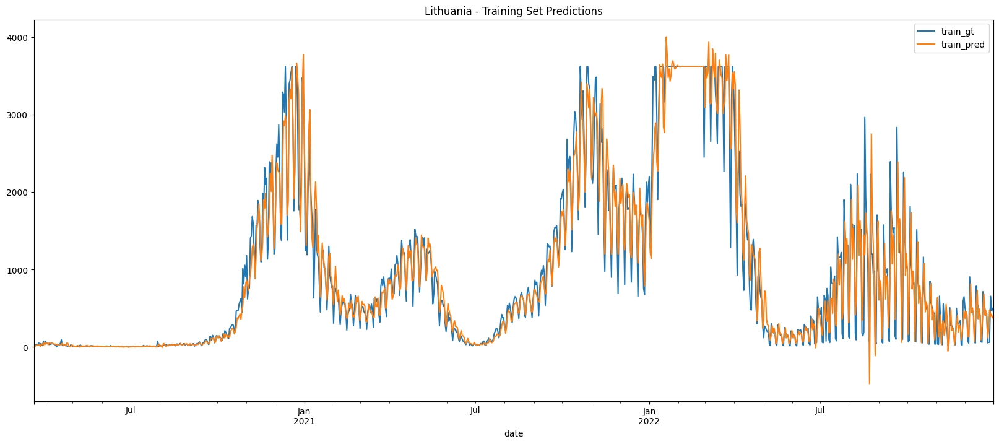

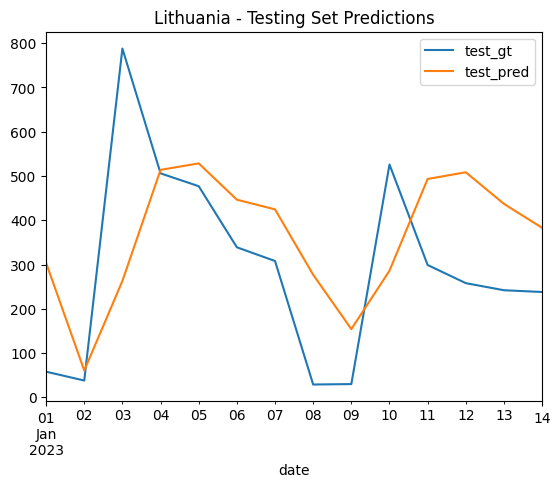

In [ ]:
rmse_results = {}
country_list = ['Belgium', 'Denmark', 'Finland', 'Ireland', 'Italy', 'Norway', 'Switzerland', 'United Kingdom', 'Poland', 'Lithuania']

for country in country_list:
    train_country, test_country = get_country_data(country, train, test) 
    
    # Fit the ARIMA model
    model_country = ARIMA(train_country, order = (5, 1, 3))  
    model_country = model_country.fit()

    print(test_country.shape)

    # Make predictions
    train_pred = model_country.fittedvalues
    pd.concat([train_country, train_pred], axis=1).plot(figsize=(20, 8))
    plt.legend(['train_gt', 'train_pred'])
    plt.title(f'{country} - Training Set Predictions')

    test_pred = model_country.predict(start=len(train_country), end=len(train_country)+len(test_country)-1, dynamic=True)
    test_pred.index = test_country.index
    pd.concat([test_country, test_pred], axis=1).plot()
    plt.legend(['test_gt', 'test_pred'])
    plt.title(f'{country} - Testing Set Predictions')

    # Calculate RMSE
    train_rmse = sqrt(mean_squared_error(train_country, train_pred))
    test_rmse = sqrt(mean_squared_error(test_country, test_pred))
    rmse_results[country] = {'train_rmse': train_rmse, 'test_rmse': test_rmse}

    print(f'{country} - Train RMSE: {train_rmse}, Test RMSE: {test_rmse}')

# Convert RMSE results to DataFrame
rmse_df = pd.DataFrame(rmse_results).T
print(rmse_df)


### Auto-ARIMA Performance

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.57 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=18738.228, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=18272.992, Time=2.31 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.57 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=18721.263, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=18091.647, Time=3.74 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=6.36 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.79 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=18150.391, Time=0.80 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=18030.546, Time=2.86 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=18217.633, Time=0.75 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=8.19 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=3.26 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=17921.909, Time=6.84 sec
 ARIMA(3,1,0)(1,1,0)[12]             : AI

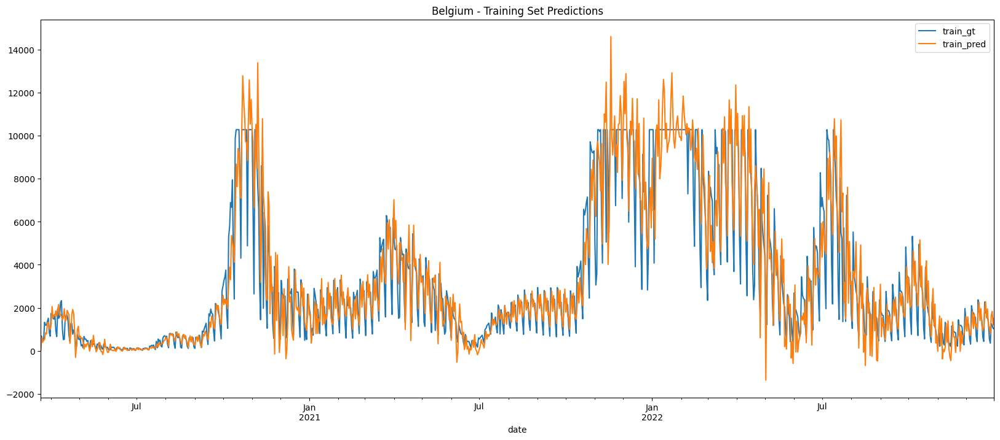

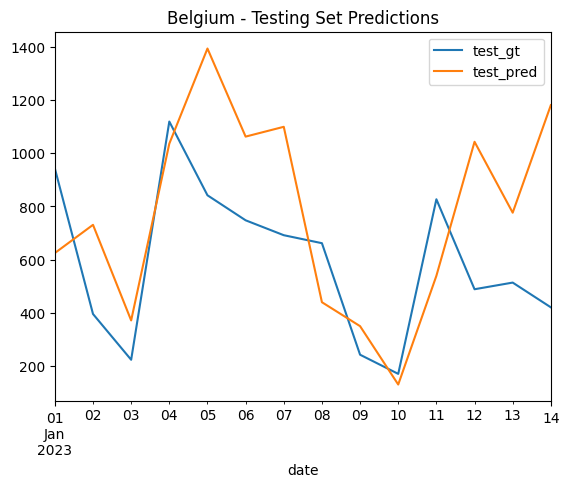

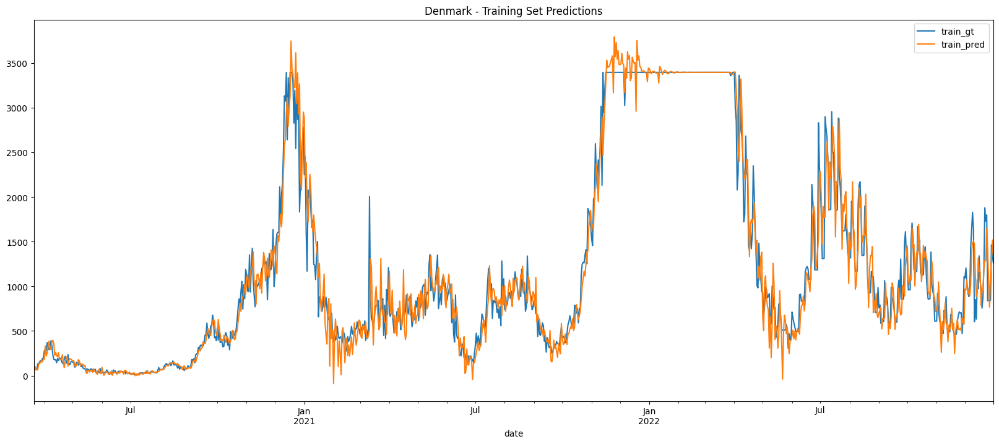

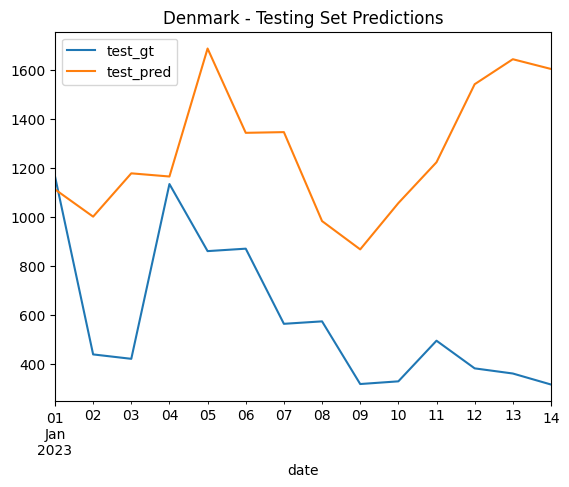

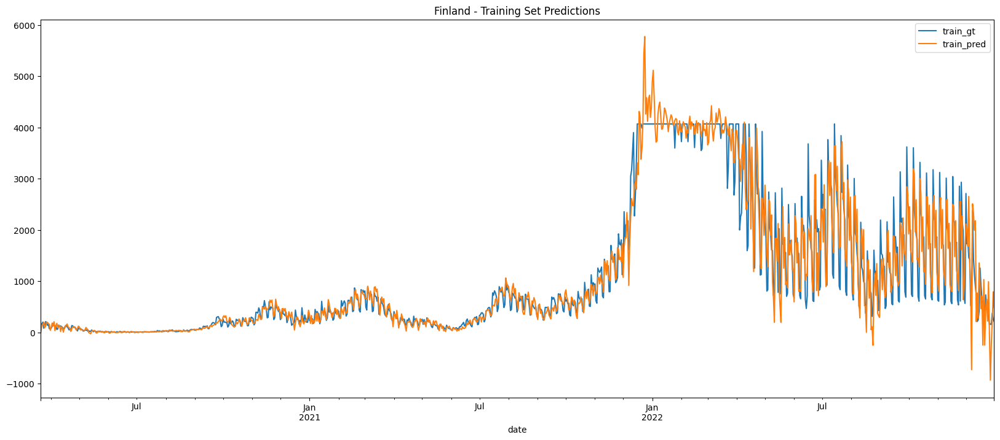

...

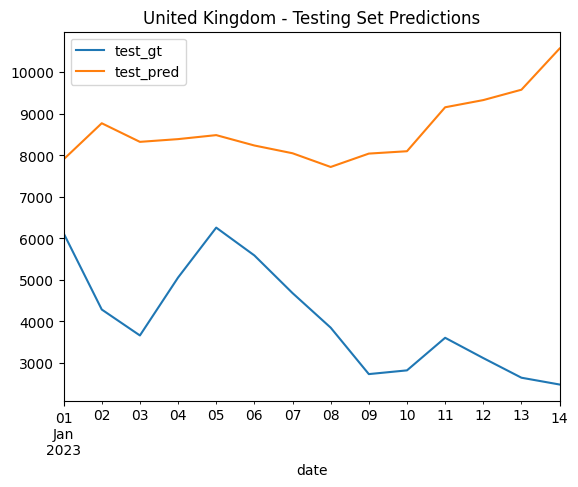

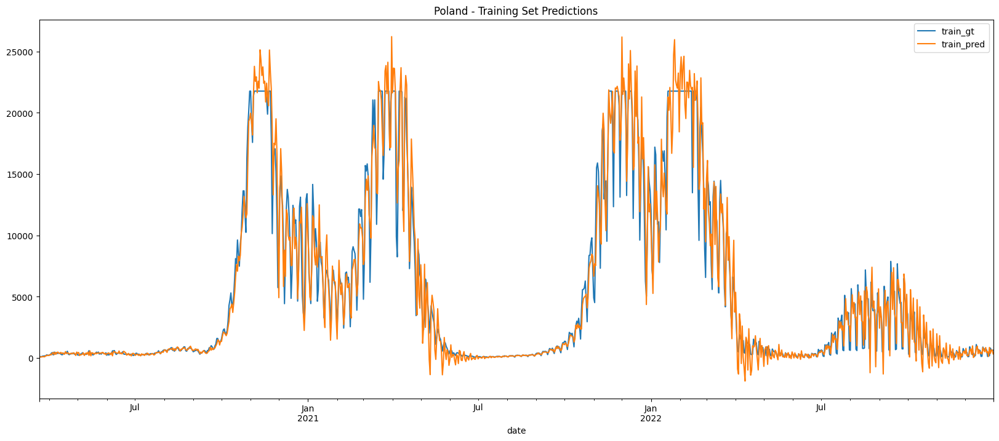

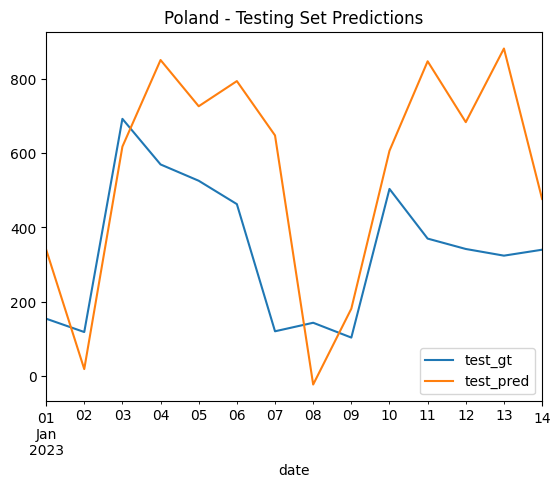

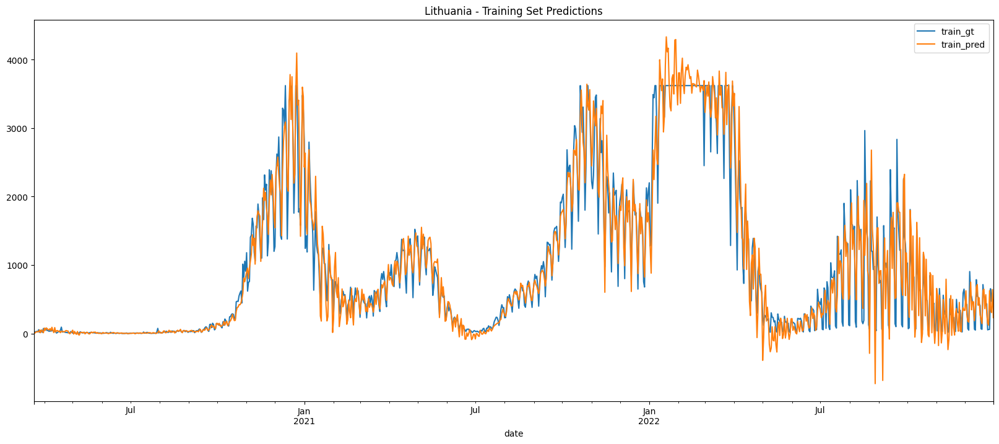

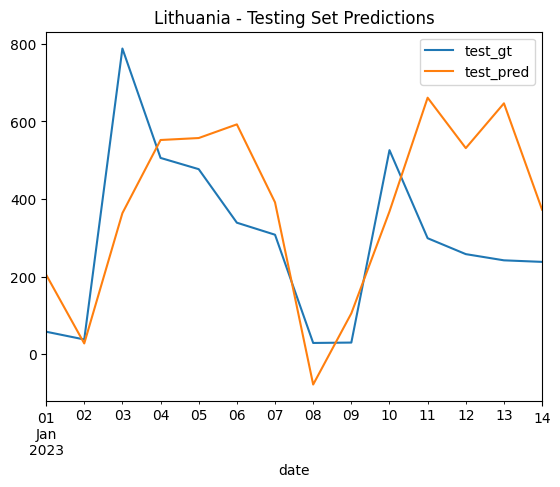

In [ ]:
rmse_results = {}
country_list = ['Belgium', 'Denmark', 'Finland', 'Ireland', 'Italy', 'Norway', 'Switzerland', 'United Kingdom', 'Poland', 'Lithuania']

for country in country_list:
    train_country, test_country = get_country_data(country, train, test) 
    
    # Fit the Auto ARIMA model
    model_auto_country = auto_arima(train_country, start_p=1, start_q=1,
                                    max_p=5, max_q=5, m=12,
                                    start_P=0, seasonal=True,
                                    d=1, D=1, trace=True,
                                    error_action='ignore',  
                                    suppress_warnings=True, 
                                    stepwise=True)
    print(f'{country} - AIC: {model_auto_country.aic()}')

    # Make predictions on the training set
    train_pred = model_auto_country.predict_in_sample()
    pd.concat([train_country, pd.Series(train_pred, index=train_country.index)], axis=1).plot(figsize=(20, 8))
    plt.legend(['train_gt', 'train_pred'])
    plt.title(f'{country} - Training Set Predictions')

    # Make predictions on the testing set
    test_pred = model_auto_country.predict(n_periods=len(test_country))
    pd.concat([test_country, pd.Series(test_pred, index=test_country.index)], axis=1).plot()
    plt.legend(['test_gt', 'test_pred'])
    plt.title(f'{country} - Testing Set Predictions')

    # Calculate RMSE
    train_rmse = sqrt(mean_squared_error(train_country, train_pred))
    test_rmse = sqrt(mean_squared_error(test_country, test_pred))
    rmse_results[country] = {
        'train_rmse': train_rmse, 
        'test_rmse': test_rmse,
        'order': model_auto_country.order,
        'seasonal_order': model_auto_country.seasonal_order,
        'aic': model_auto_country.aic()
    }

    print(f'{country} - Train RMSE: {train_rmse}, Test RMSE: {test_rmse}, Order: {model_auto_country.order}, Seasonal Order: {model_auto_country.seasonal_order}, AIC: {model_auto_country.aic()}')

# Convert RMSE and ARIMA parameter results to DataFrame
rmse_df = pd.DataFrame(rmse_results).T
print(rmse_df)


### Prophet Single Performance

17:04:03 - cmdstanpy - INFO - Chain [1] start processing
17:04:04 - cmdstanpy - INFO - Chain [1] done processing
17:04:04 - cmdstanpy - INFO - Chain [1] start processing


Belgium - Train RMSE: 1711.7758233906309, Test RMSE: 556.0900421712332, Test SRMSE: 93.90013979492541


17:04:04 - cmdstanpy - INFO - Chain [1] done processing
17:04:05 - cmdstanpy - INFO - Chain [1] start processing


Denmark - Train RMSE: 2496.7725075198778, Test RMSE: 408.55191659851437, Test SRMSE: 69.59151761016183


17:04:05 - cmdstanpy - INFO - Chain [1] done processing
17:04:06 - cmdstanpy - INFO - Chain [1] start processing


Finland - Train RMSE: 627.6668847123697, Test RMSE: 277.5533699734428, Test SRMSE: 211.06720150071695


17:04:06 - cmdstanpy - INFO - Chain [1] done processing
17:04:06 - cmdstanpy - INFO - Chain [1] start processing


Ireland - Train RMSE: 1050.5846557534162, Test RMSE: 279.09297320250283, Test SRMSE: 61.8733432277916


17:04:07 - cmdstanpy - INFO - Chain [1] done processing


Italy - Train RMSE: 14935.357941987048, Test RMSE: 21810.985043022745, Test SRMSE: 149.40054142765084


17:04:08 - cmdstanpy - INFO - Chain [1] start processing
17:04:08 - cmdstanpy - INFO - Chain [1] done processing
17:04:09 - cmdstanpy - INFO - Chain [1] start processing


Lithuania - Train RMSE: 665.1922601161277, Test RMSE: 189.16967450541028, Test SRMSE: 64.03228827552572


17:04:09 - cmdstanpy - INFO - Chain [1] done processing
17:04:09 - cmdstanpy - INFO - Chain [1] start processing


Norway - Train RMSE: 1243.5329316232094, Test RMSE: 138.5509933566079, Test SRMSE: 107.16651419848127


17:04:10 - cmdstanpy - INFO - Chain [1] done processing


Poland - Train RMSE: 3446.5755540938294, Test RMSE: 295.16237845429174, Test SRMSE: 86.6304674708613


17:04:11 - cmdstanpy - INFO - Chain [1] start processing
17:04:13 - cmdstanpy - INFO - Chain [1] done processing
17:04:14 - cmdstanpy - INFO - Chain [1] start processing


Switzerland - Train RMSE: 482.45086660456013, Test RMSE: 322.3488658931079, Test SRMSE: 109.82925584092263


17:04:14 - cmdstanpy - INFO - Chain [1] done processing


United Kingdom - Train RMSE: 8354.00939164358, Test RMSE: 3106.00551528402, Test SRMSE: 76.40312965874175
                  train_rmse     test_rmse  test_srmse
Belgium          1711.775823    556.090042   93.900140
Denmark          2496.772508    408.551917   69.591518
Finland           627.666885    277.553370  211.067202
Ireland          1050.584656    279.092973   61.873343
Italy           14935.357942  21810.985043  149.400541
Lithuania         665.192260    189.169675   64.032288
Norway           1243.532932    138.550993  107.166514
Poland           3446.575554    295.162378   86.630467
Switzerland       482.450867    322.348866  109.829256
United Kingdom   8354.009392   3106.005515   76.403130


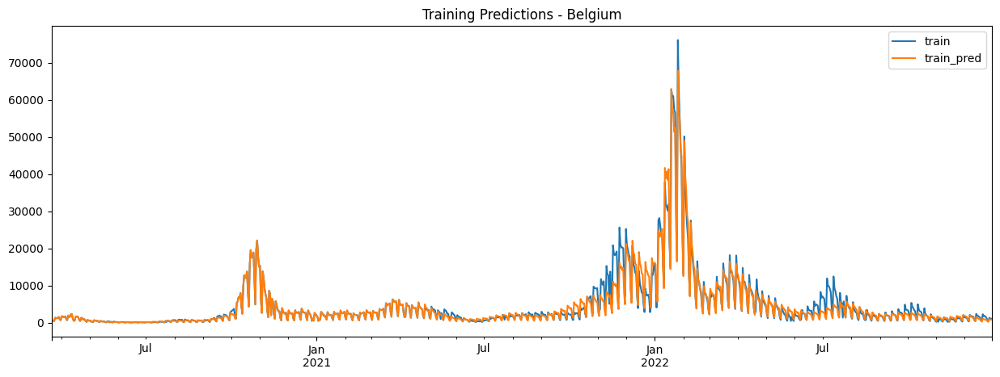

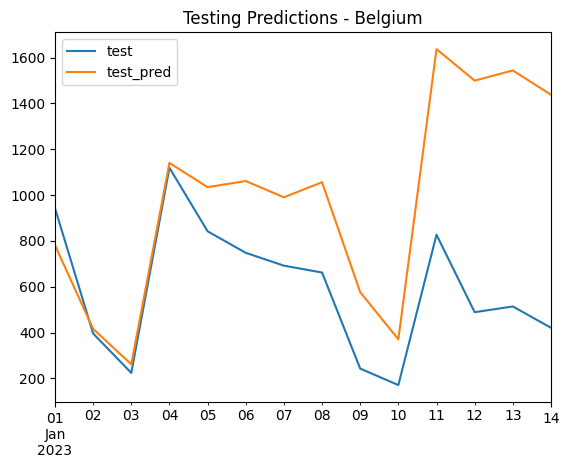

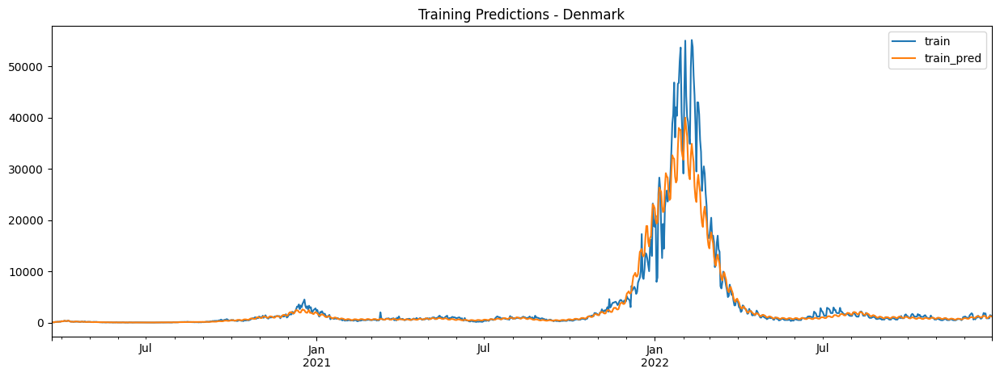

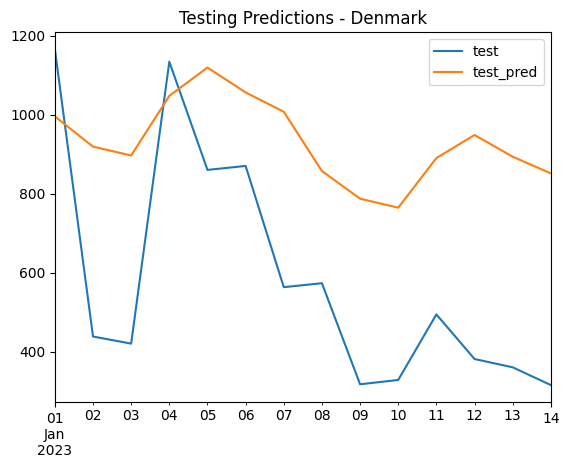

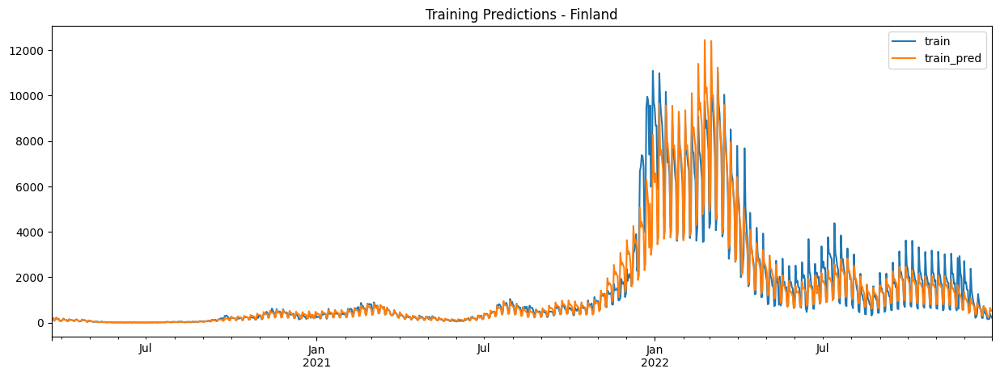

...

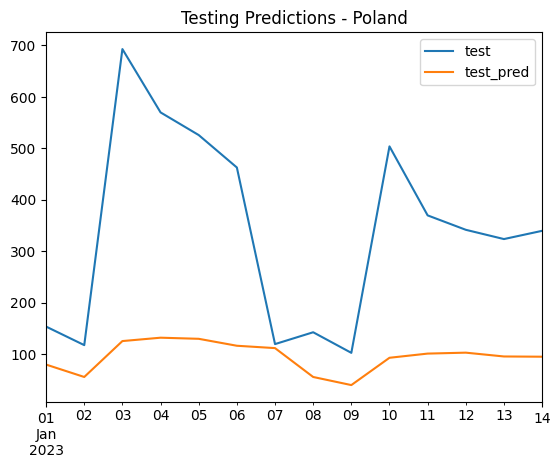

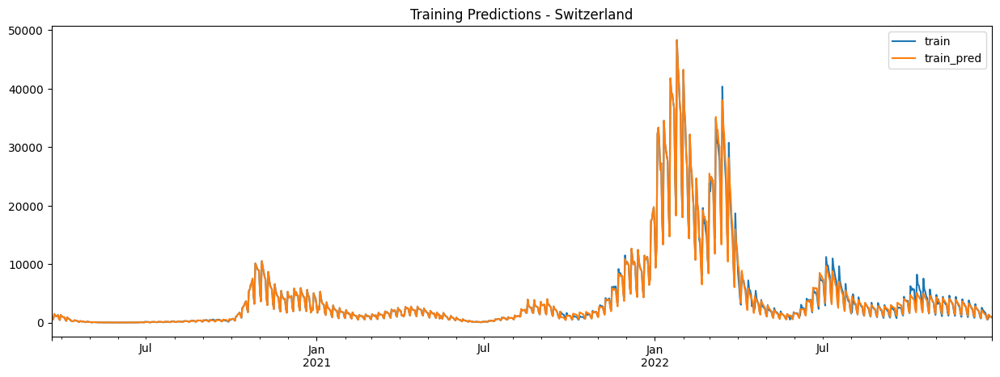

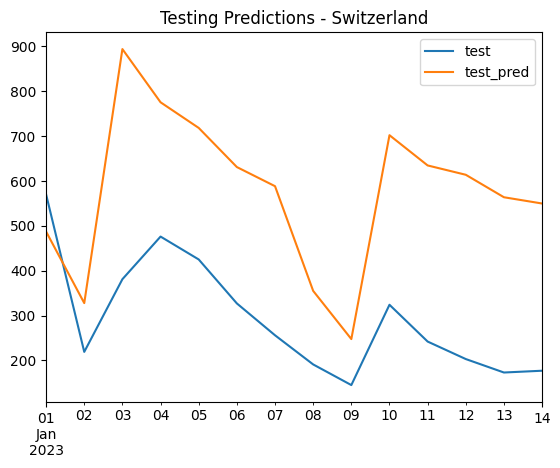

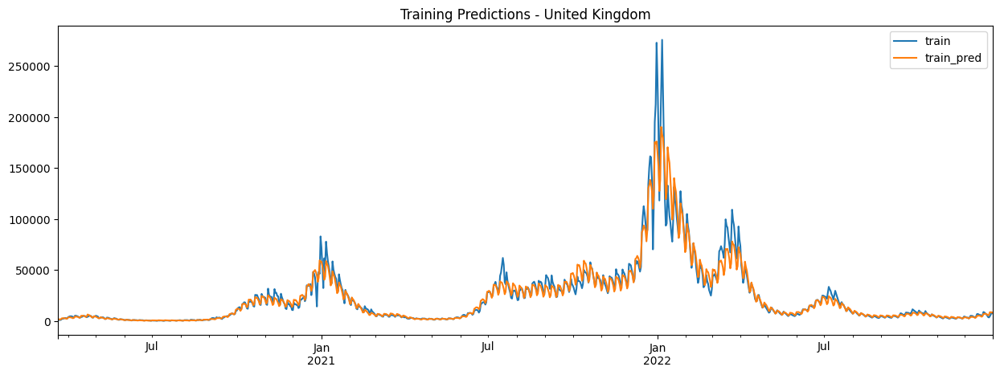

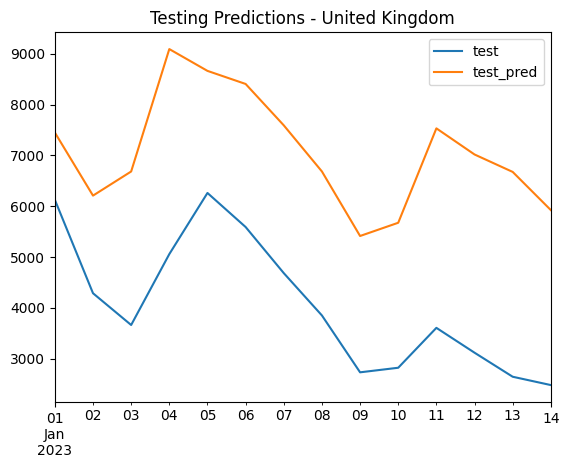

In [ ]:
## applying cv results for Italy
rmse_results_cv = {}
data_clean['date'] = pd.to_datetime(data_clean['date'])
split_date = pd.to_datetime('2023-01-01')

for country in data_clean['location'].unique():
    data_country = data_clean[data_clean['location'] == country]
    data_country = data_country.drop(['location'], axis=1)
    train_country = data_country[data_country['date'] < split_date]
    test_country = data_country[data_country['date'] >= split_date]
    
    country_holidays = globals().get(f'holiday_{country.lower()}')

    # Create and fit the model with the parameters tuned for Italy
    model_country = Prophet(
        holidays=country_holidays,  
        holidays_prior_scale=25,
        seasonality_prior_scale=5,
        changepoint_prior_scale=0.1,
        seasonality_mode='additive'
    )
    model_country.fit(train_country.rename(columns={'date': 'ds', 'new_cases_log': 'y'}))

    # training preds
    train_pred = model_country.predict(train_country.reset_index().rename(columns={'date': 'ds', 'new_cases_log': 'y'})).set_index('ds')
    train_pred['yhat_exp'] = np.exp(train_pred['yhat'])
    pd.concat([train_country.set_index('date')['new_cases'],train_pred['yhat_exp']], axis=1).plot(figsize=(15,5)) 
    plt.title(f'Training Predictions - {country}')
    plt.legend(['train', 'train_pred'])

    # tests preds
    test_pred = model_country.predict(test_country.reset_index().rename(columns={'date': 'ds', 'new_cases_log': 'y'})).set_index('ds')
    test_pred['yhat_exp'] = np.exp(test_pred['yhat'])
    pd.concat([test_country.set_index('date')['new_cases'],test_pred['yhat_exp']], axis=1).plot( )
    plt.title(f'Testing Predictions - {country}')
    plt.legend(['test', 'test_pred'])

    # RMSE for training and testing sets
    train_rmse = np.sqrt(mean_squared_error(train_country['new_cases'], train_pred['yhat_exp']))
    test_rmse = np.sqrt(mean_squared_error(test_country['new_cases'], test_pred['yhat_exp']))
    test_srmse = test_rmse / np.mean(test_country['new_cases']) * 100
    rmse_results_cv[country] = {'train_rmse': train_rmse, 'test_rmse': test_rmse, 'test_srmse': test_srmse}
    print(f"{country} - Train RMSE: {train_rmse}, Test RMSE: {test_rmse}, Test SRMSE: {test_srmse}")

rmse_df_cv = pd.DataFrame(rmse_results_cv).T
print(rmse_df_cv)

### Prophet Multiple Performance

15:02:20 - cmdstanpy - INFO - Chain [1] start processing
15:02:20 - cmdstanpy - INFO - Chain [1] done processing


Belgium - Train RMSE: 2702.9417563802376, Test RMSE: 406.7282317242071, Test SRMSE: 68.67923343551924


15:02:21 - cmdstanpy - INFO - Chain [1] start processing
15:02:21 - cmdstanpy - INFO - Chain [1] done processing
15:02:22 - cmdstanpy - INFO - Chain [1] start processing


Denmark - Train RMSE: 2359.789245501919, Test RMSE: 270.6524319571712, Test SRMSE: 46.10212978951693


15:02:22 - cmdstanpy - INFO - Chain [1] done processing
15:02:23 - cmdstanpy - INFO - Chain [1] start processing


Finland - Train RMSE: 549.8147479064259, Test RMSE: 184.3795057603897, Test SRMSE: 140.2125519090416


15:02:23 - cmdstanpy - INFO - Chain [1] done processing
15:02:23 - cmdstanpy - INFO - Chain [1] start processing


Ireland - Train RMSE: 949.0611426804002, Test RMSE: 244.05989554214847, Test SRMSE: 54.10670685019918


15:02:24 - cmdstanpy - INFO - Chain [1] done processing
15:02:25 - cmdstanpy - INFO - Chain [1] start processing


Italy - Train RMSE: 12509.215715808654, Test RMSE: 7592.0809463473415, Test SRMSE: 52.00411635281418


15:02:25 - cmdstanpy - INFO - Chain [1] done processing
15:02:26 - cmdstanpy - INFO - Chain [1] start processing


Lithuania - Train RMSE: 1124.9403152309635, Test RMSE: 284.50930623289617, Test SRMSE: 96.30392377322403


15:02:26 - cmdstanpy - INFO - Chain [1] done processing
15:02:26 - cmdstanpy - INFO - Chain [1] start processing


Norway - Train RMSE: 1096.613577970866, Test RMSE: 54.044955951097656, Test SRMSE: 41.802728359965045


15:02:27 - cmdstanpy - INFO - Chain [1] done processing
15:02:27 - cmdstanpy - INFO - Chain [1] start processing


Poland - Train RMSE: 3680.43119527604, Test RMSE: 353.7703160041646, Test SRMSE: 103.8319585756458


15:02:28 - cmdstanpy - INFO - Chain [1] done processing
15:02:28 - cmdstanpy - INFO - Chain [1] start processing


Switzerland - Train RMSE: 1513.0627891186602, Test RMSE: 580.8434948021733, Test SRMSE: 197.90238323753775


15:02:29 - cmdstanpy - INFO - Chain [1] done processing


United Kingdom - Train RMSE: 6688.585259793004, Test RMSE: 1530.2440739637238, Test SRMSE: 37.641734960628554
                  train_rmse    test_rmse  test_srmse
Belgium          2702.941756   406.728232   68.679233
Denmark          2359.789246   270.652432   46.102130
Finland           549.814748   184.379506  140.212552
Ireland           949.061143   244.059896   54.106707
Italy           12509.215716  7592.080946   52.004116
Lithuania        1124.940315   284.509306   96.303924
Norway           1096.613578    54.044956   41.802728
Poland           3680.431195   353.770316  103.831959
Switzerland      1513.062789   580.843495  197.902383
United Kingdom   6688.585260  1530.244074   37.641735


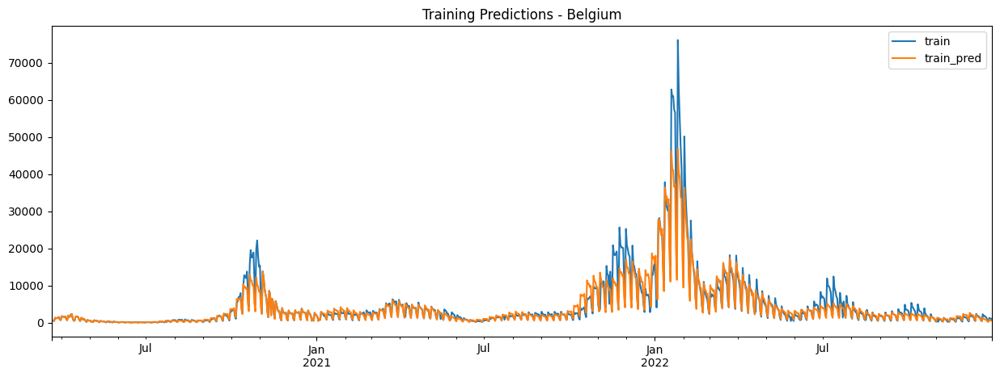

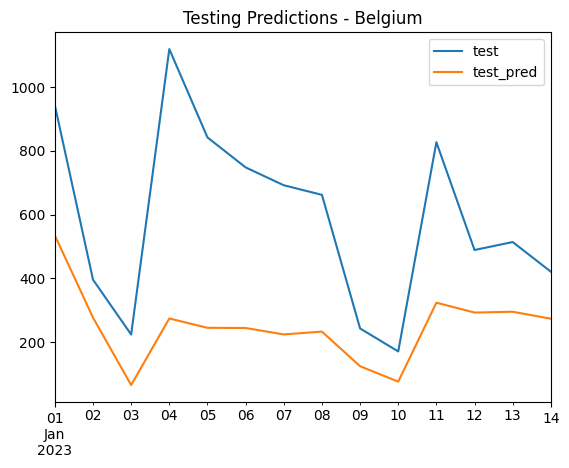

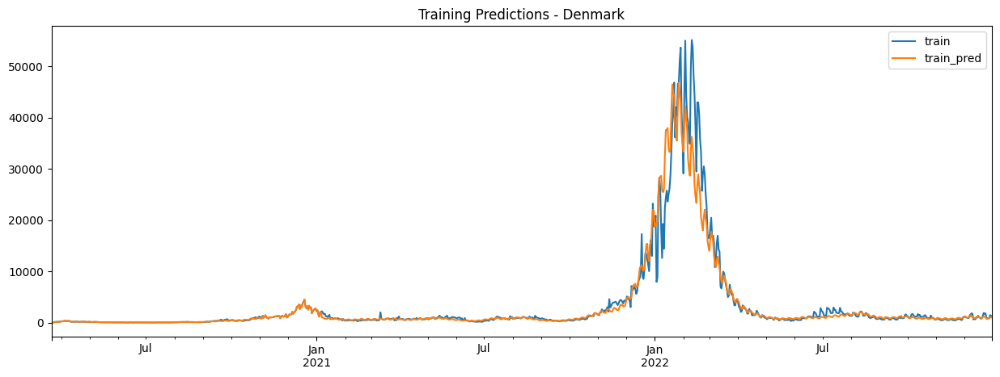

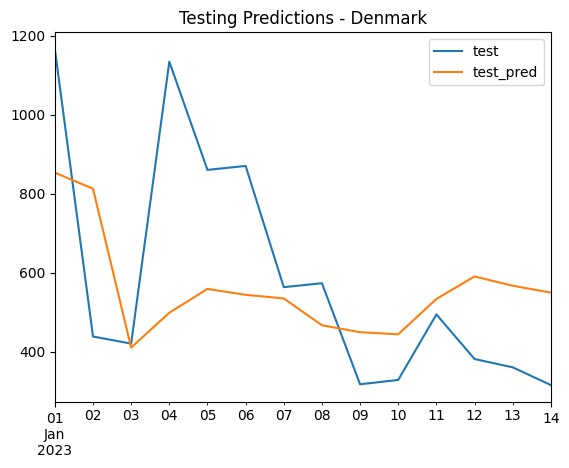

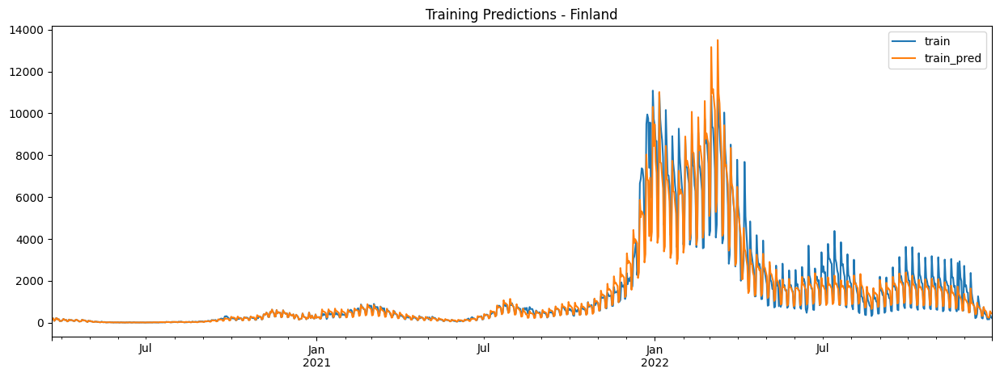

...

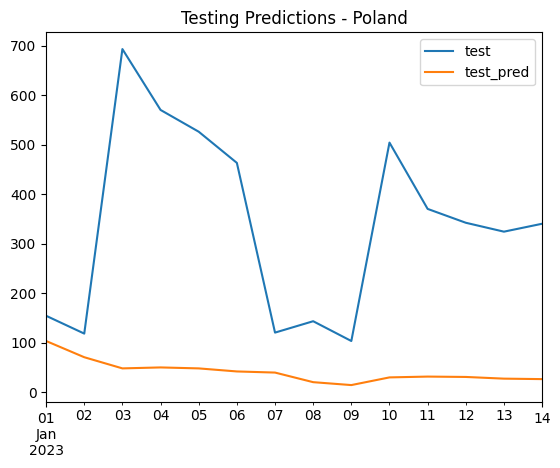

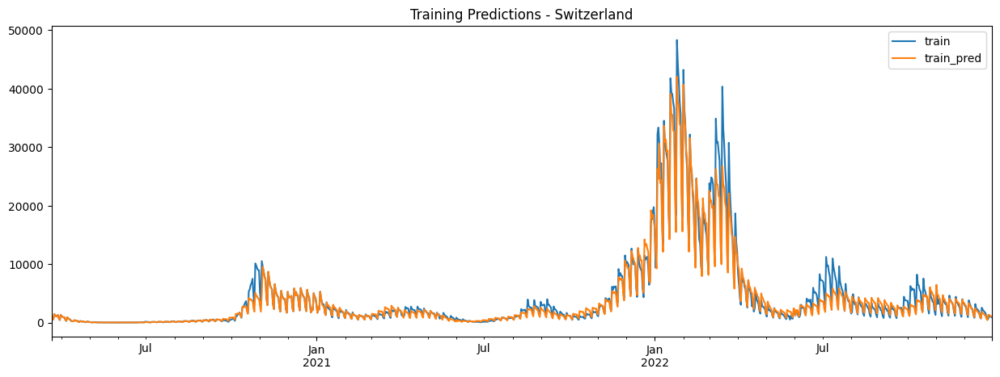

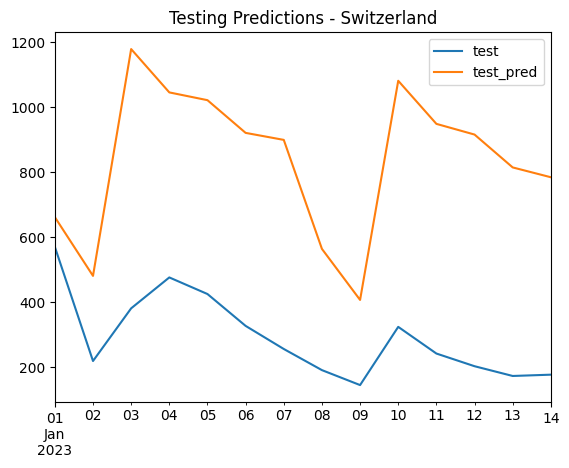

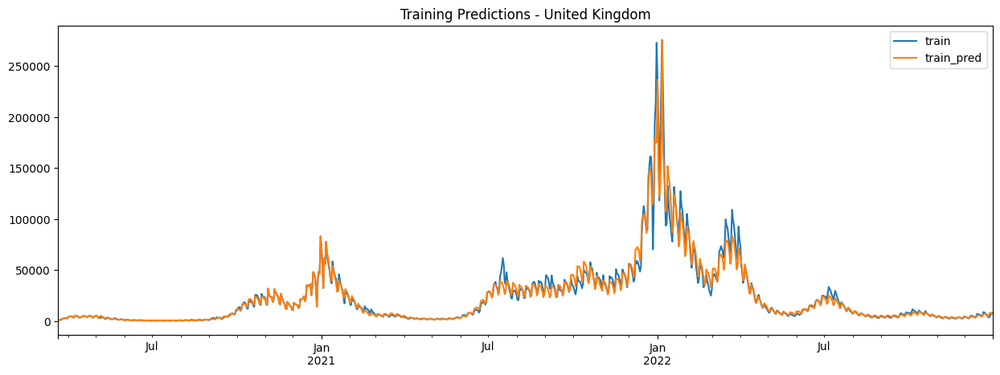

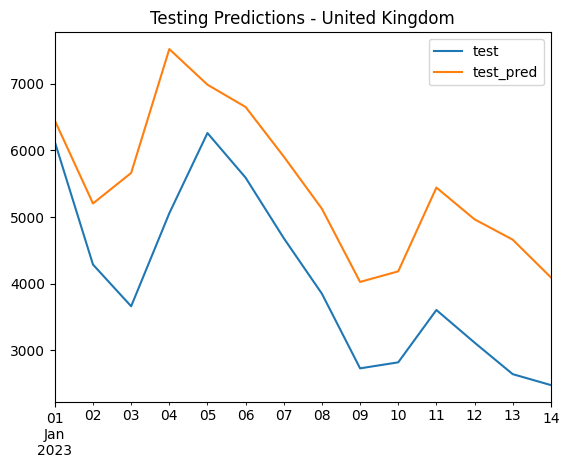

In [ ]:
rmse_results = {}
data_clean['date'] = pd.to_datetime(data_clean['date'])
split_date = pd.to_datetime('2023-01-01')

for country in data_clean['location'].unique():
    data_country = data_clean[data_clean['location'] == country]
    data_country = data_country.drop(['location'], axis=1)
    train_country = data_country[data_country['date'] < split_date]
    test_country = data_country[data_country['date'] >= split_date]
    
    country_holidays = globals().get(f'holiday_{country.lower()}')

    # Create and fit the model with the parameters tuned for Italy
    model_country = Prophet(
            holidays=holiday_italy,
            holidays_prior_scale = 25,
            seasonality_prior_scale = 1,
            changepoint_prior_scale = 0.1,
            seasonality_mode = 'additive'
             )
    for col in features_to_include:
        model_country.add_regressor(col)
    model_country.fit(train_country.rename(columns={'date': 'ds', 'new_cases_log': 'y'}))

    # training preds
    train_pred = model_country.predict(train_country.reset_index().rename(columns={'date': 'ds', 'new_cases_log': 'y'})).set_index('ds')
    train_pred['yhat_exp'] = np.exp(train_pred['yhat'])
    pd.concat([train_country.set_index('date')['new_cases'],train_pred['yhat_exp']], axis=1).plot(figsize=(15,5)) 
    plt.title(f'Training Predictions - {country}')
    plt.legend(['train', 'train_pred'])

    # tests preds
    test_pred = model_country.predict(test_country.reset_index().rename(columns={'date': 'ds', 'new_cases_log': 'y'})).set_index('ds')
    test_pred['yhat_exp'] = np.exp(test_pred['yhat'])
    pd.concat([test_country.set_index('date')['new_cases'],test_pred['yhat_exp']], axis=1).plot( )
    plt.title(f'Testing Predictions - {country}')
    plt.legend(['test', 'test_pred'])

    # RMSE for training and testing sets
    train_rmse = np.sqrt(mean_squared_error(train_country['new_cases'], train_pred['yhat_exp']))
    test_rmse = np.sqrt(mean_squared_error(test_country['new_cases'], test_pred['yhat_exp']))
    test_srmse = test_rmse / np.mean(test_country['new_cases']) * 100
    rmse_results[country] = {'train_rmse': train_rmse, 'test_rmse': test_rmse, 'test_srmse': test_srmse}
    print(f"{country} - Train RMSE: {train_rmse}, Test RMSE: {test_rmse}, Test SRMSE: {test_srmse}")

rmse_df = pd.DataFrame(rmse_results).T
print(rmse_df)


### XGBoost Performance

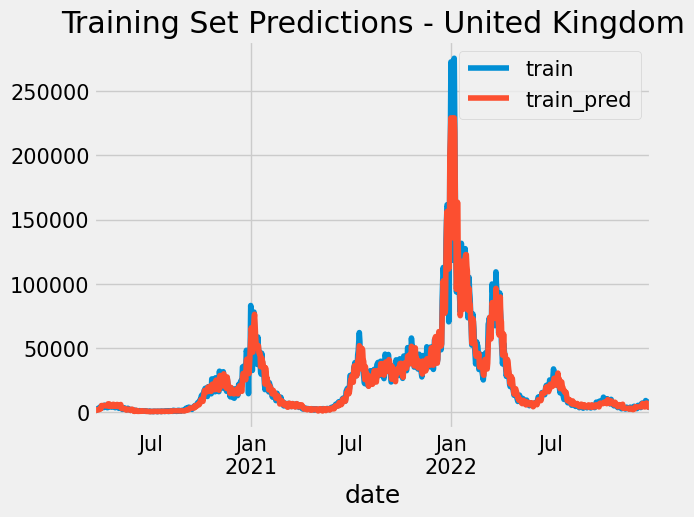

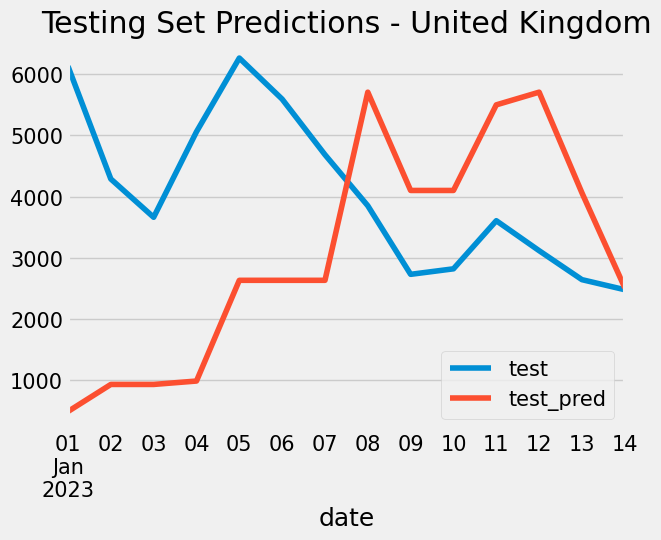

United Kingdom - Train RMSE: 4975.578647862928
United Kingdom - Test RMSE: 2831.7093075754456


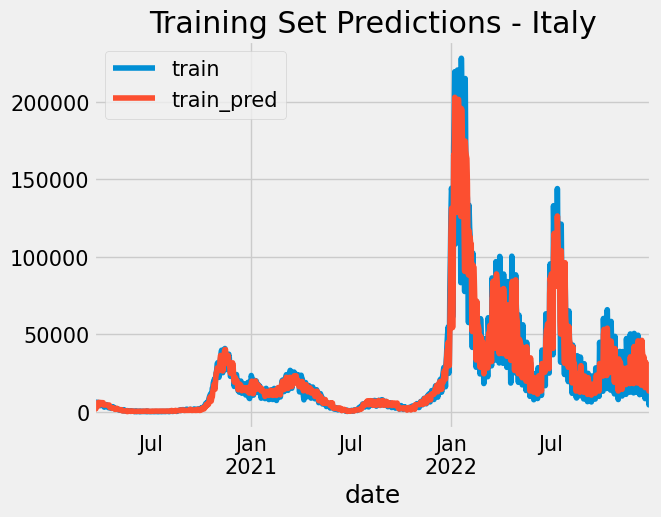

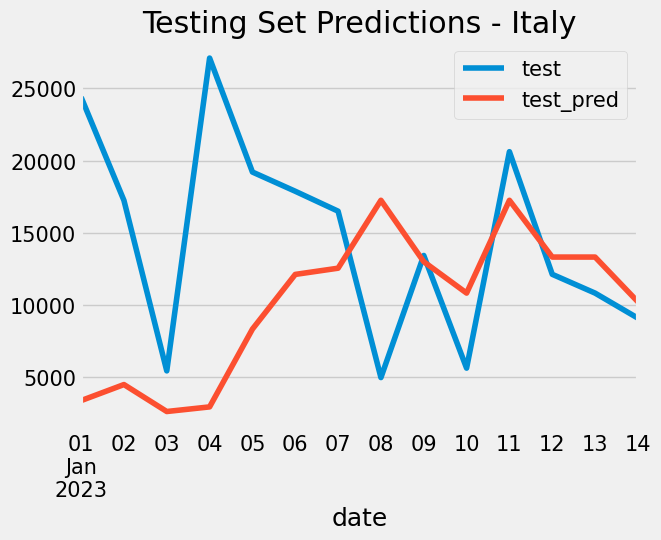

Italy - Train RMSE: 5972.533314069255
Italy - Test RMSE: 10563.167839125055


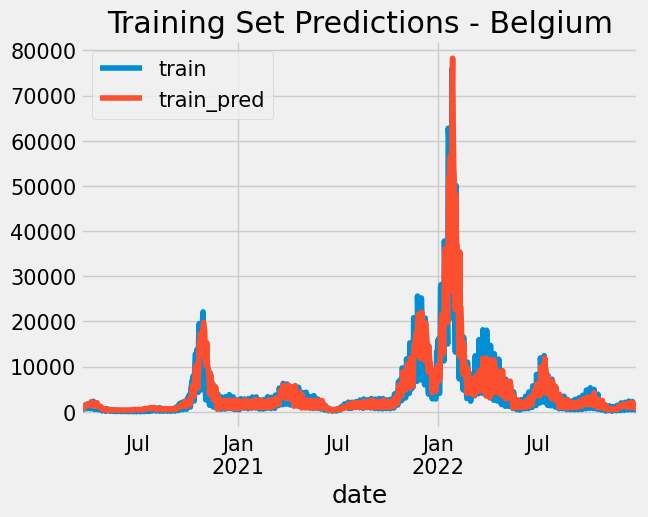

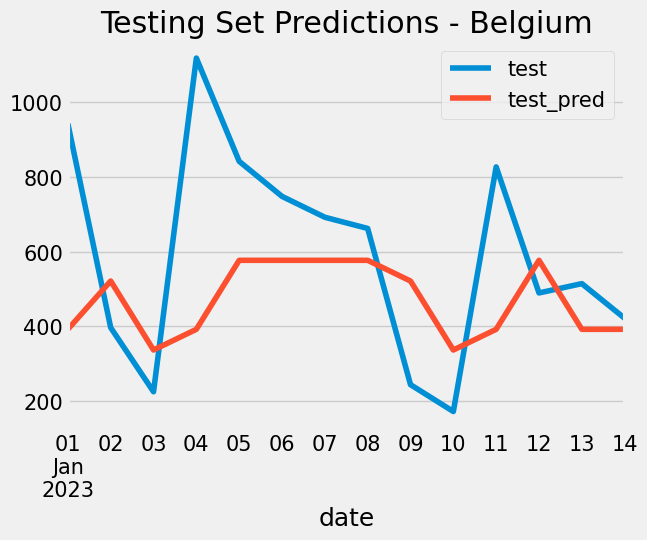

Belgium - Train RMSE: 2011.577917229889
Belgium - Test RMSE: 304.70358707077753


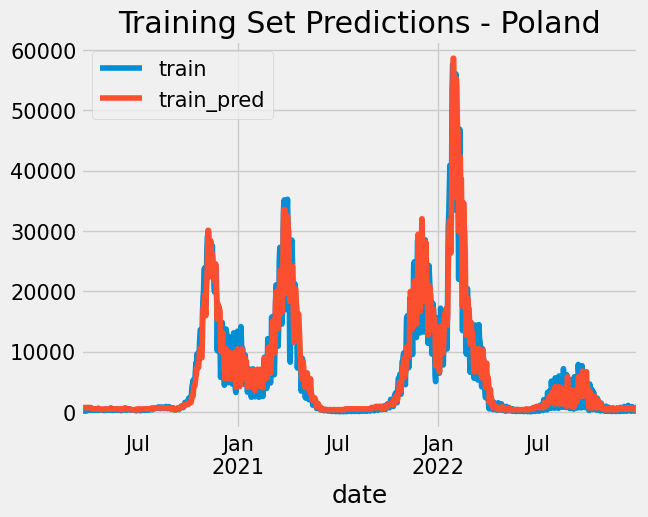

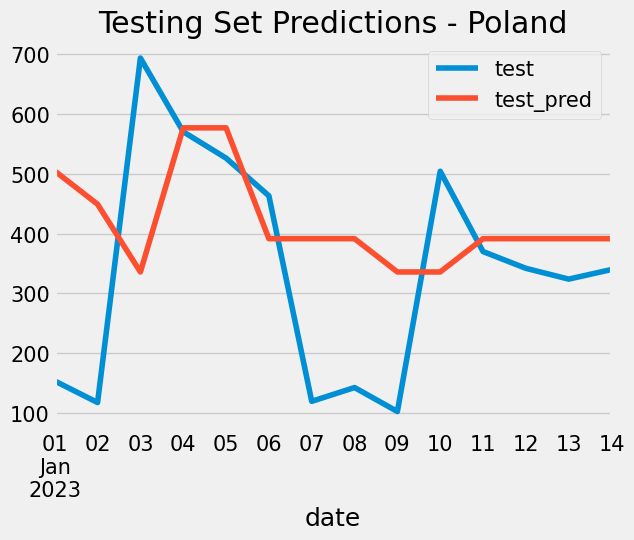

Poland - Train RMSE: 1900.618497109983
Poland - Test RMSE: 206.27768475272006


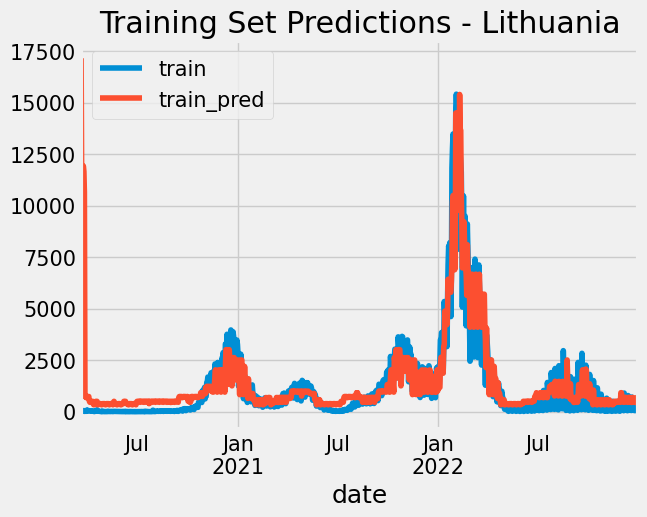

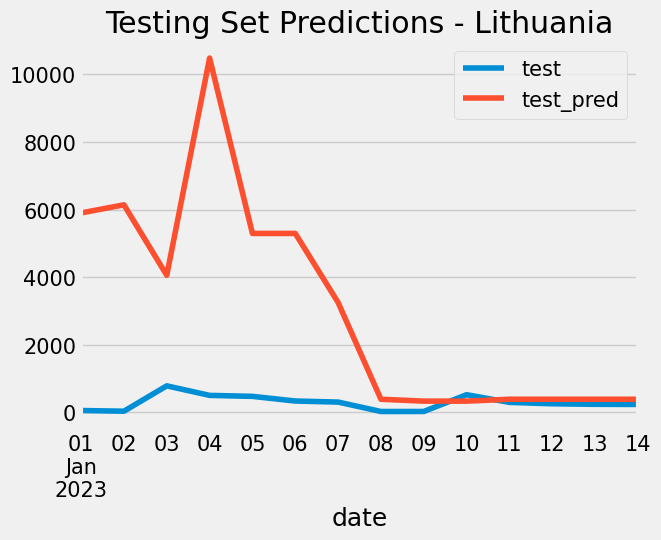

Lithuania - Train RMSE: 1092.4932749656102
Lithuania - Test RMSE: 4127.030429545026


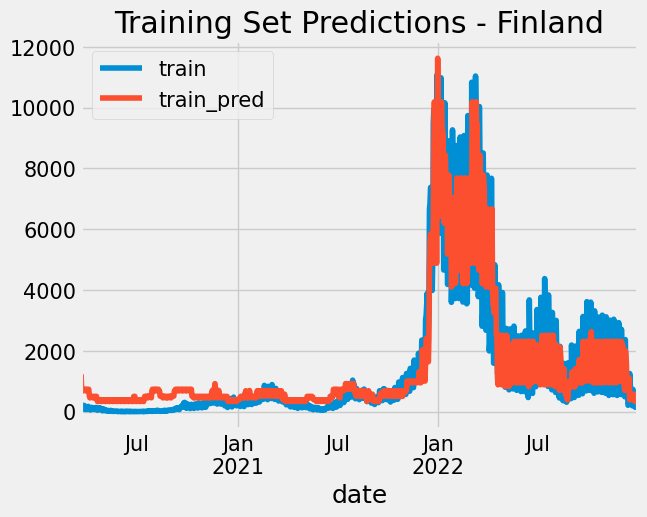

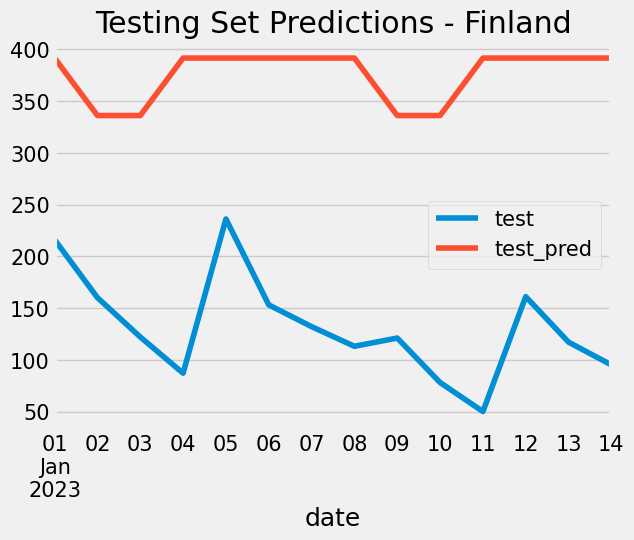

Finland - Train RMSE: 615.7853928342291
Finland - Test RMSE: 249.5578496778601


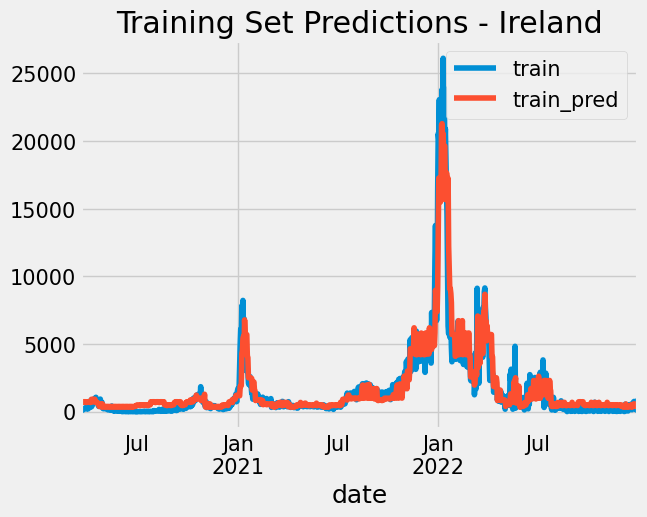

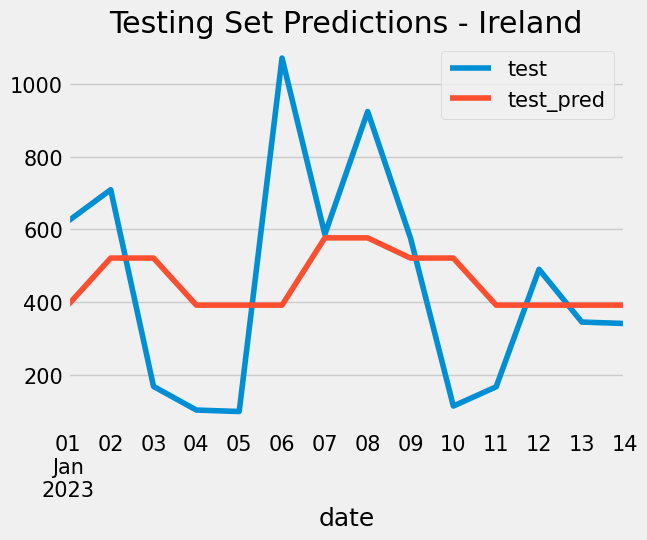

Ireland - Train RMSE: 1028.0607829305757
Ireland - Test RMSE: 292.5141133533961


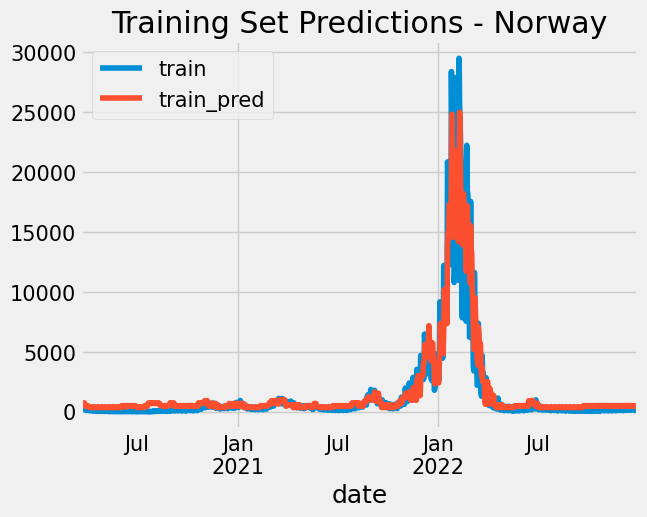

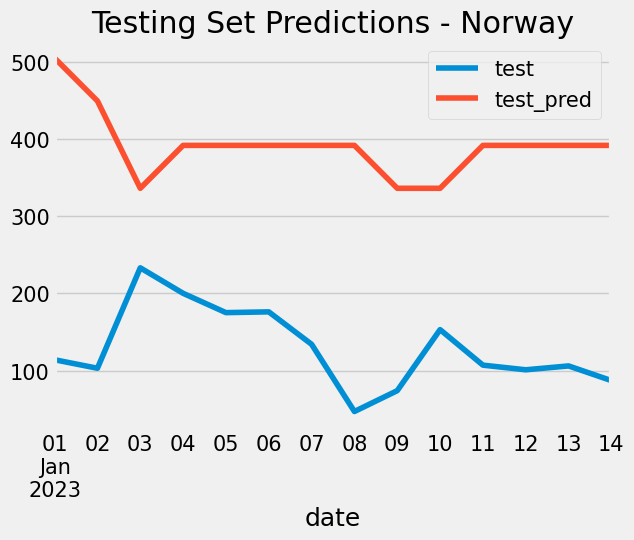

Norway - Train RMSE: 968.2354113413008
Norway - Test RMSE: 272.4746449519358


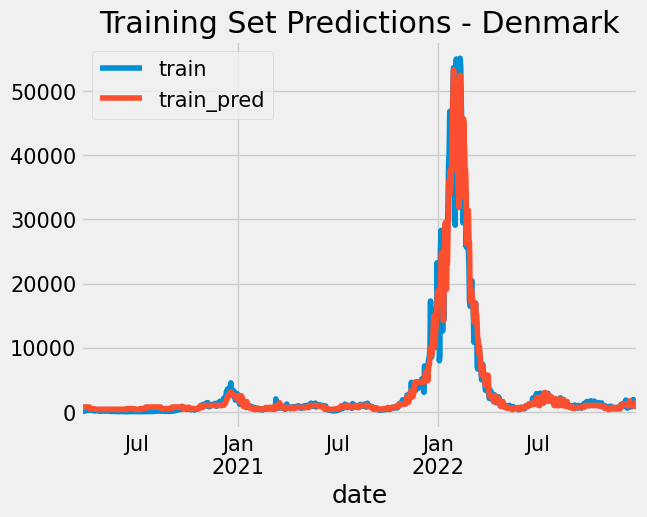

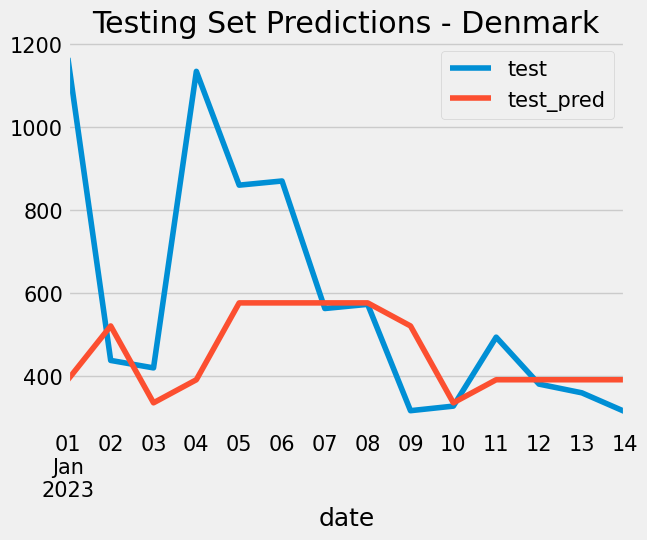

Denmark - Train RMSE: 1377.7997896062539
Denmark - Test RMSE: 315.2056464991712


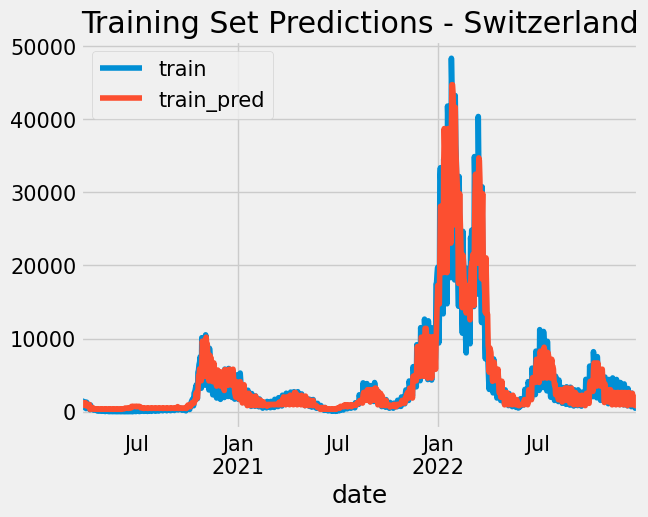

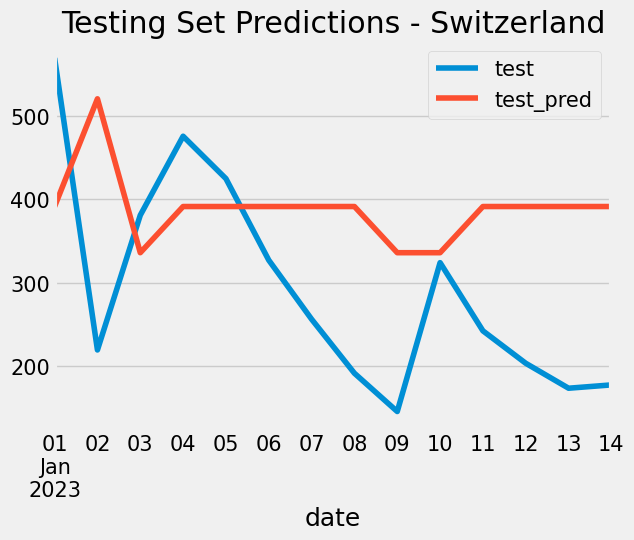

Switzerland - Train RMSE: 1630.3450412295826
Switzerland - Test RMSE: 165.67847441906792
                 train_rmse     test_rmse
United Kingdom  4975.578648   2831.709308
Italy           5972.533314  10563.167839
Belgium         2011.577917    304.703587
Poland          1900.618497    206.277685
Lithuania       1092.493275   4127.030430
Finland          615.785393    249.557850
Ireland         1028.060783    292.514113
Norway           968.235411    272.474645
Denmark         1377.799790    315.205646
Switzerland     1630.345041    165.678474


In [ ]:
countries = ['United Kingdom', 'Italy', 'Belgium', 'Poland','Lithuania','Finland', 'Ireland', 'Norway', 'Denmark','Switzerland']
rmse_results = {}

for country in countries:
    location_column = f'location_{country}'

    # train set preds
    train_pred = pd.DataFrame(model4.predict(x_train), columns=['yhat'], index=train.index)
    train_combined = pd.concat([x_train, y_train, train_pred['yhat']], axis=1)
    subset_country_train = train_combined[train_combined[location_column] == 1]

    subset_country_train[['y', 'yhat']].plot()
    plt.title(f'Training Set Predictions - {country}')
    plt.legend(['train', 'train_pred'])
    plt.show()

    # test set preds
    test_pred = pd.DataFrame(model4.predict(x_test), columns=['yhat'], index=test.index)
    test_combined = pd.concat([x_test, y_test, test_pred['yhat']], axis=1)
    subset_country_test = test_combined[test_combined[location_column] == 1]

    subset_country_test[['y', 'yhat']].plot()
    plt.title(f'Testing Set Predictions - {country}')
    plt.legend(['test', 'test_pred'])
    plt.show()

    # Calculate and print RMSE for training and testing sets
    train_rmse = sqrt(mean_squared_error(subset_country_train['y'], subset_country_train['yhat']))
    test_rmse = sqrt(mean_squared_error(subset_country_test['y'], subset_country_test['yhat']))
    rmse_results[country] = {'train_rmse': train_rmse, 'test_rmse': test_rmse}
    
    print(f'{country} - Train RMSE: {train_rmse}')
    print(f'{country} - Test RMSE: {test_rmse}')
    
rmse_df = pd.DataFrame(rmse_results).T
print(rmse_df)

### XGBoost Performance (using data before July 2022)

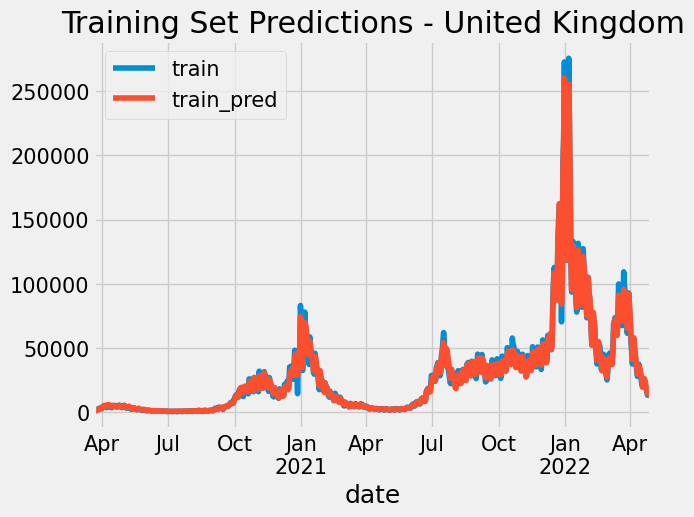

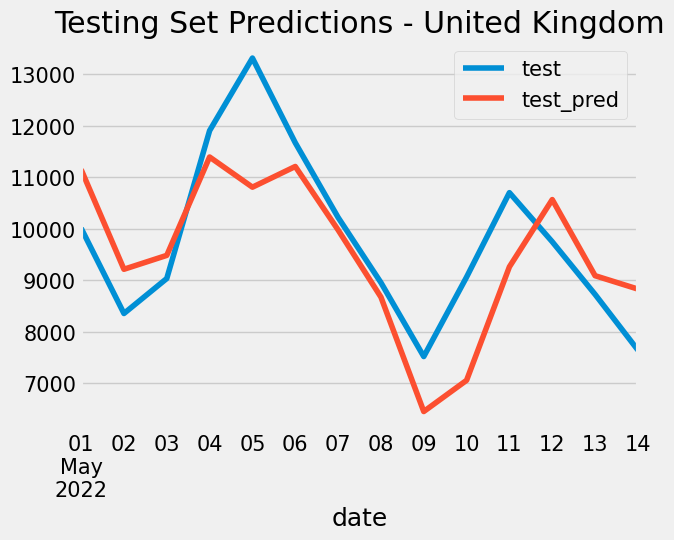

United Kingdom - Train RMSE: 2570.437138522382
United Kingdom - Test RMSE: 1152.8371332746378


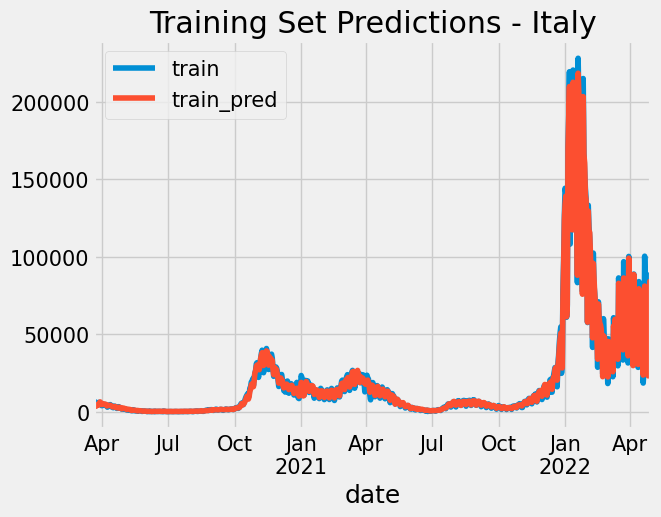

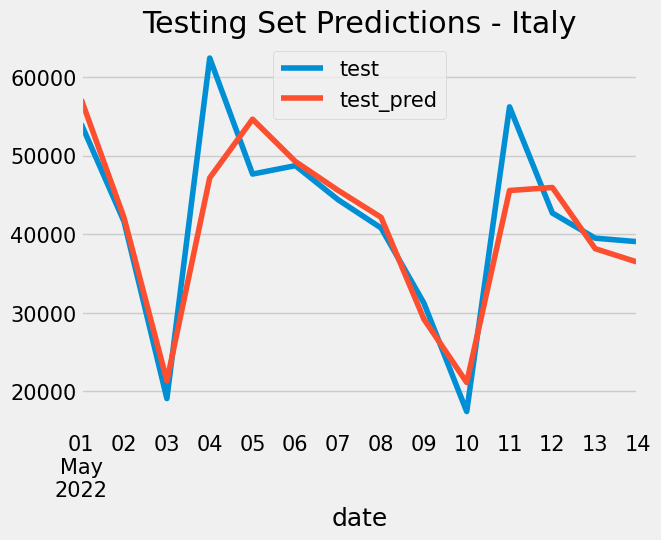

Italy - Train RMSE: 2342.8120075917423
Italy - Test RMSE: 5670.803434161197


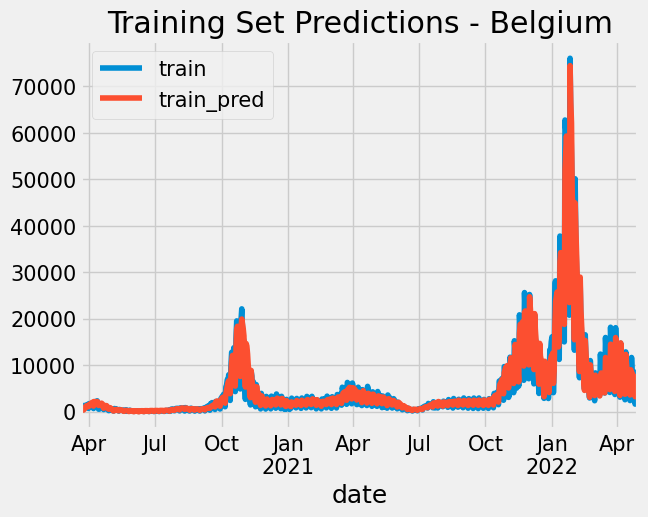

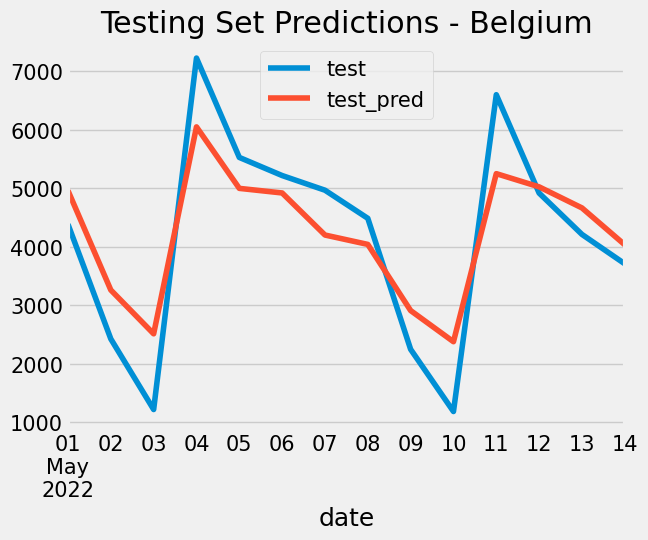

Belgium - Train RMSE: 1286.531174372057
Belgium - Test RMSE: 813.3978098151213


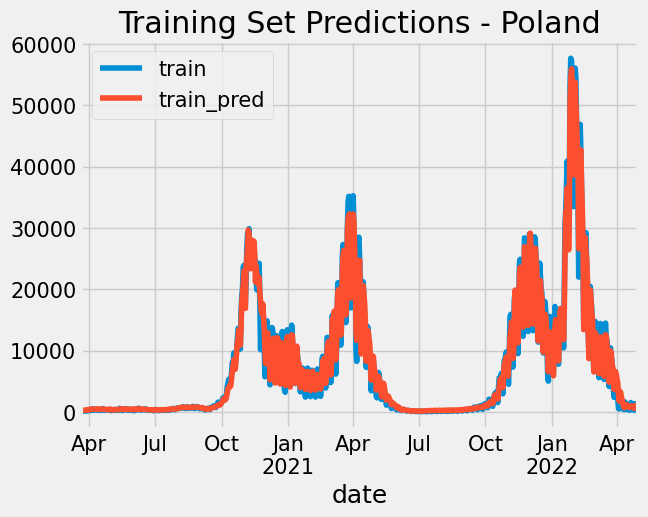

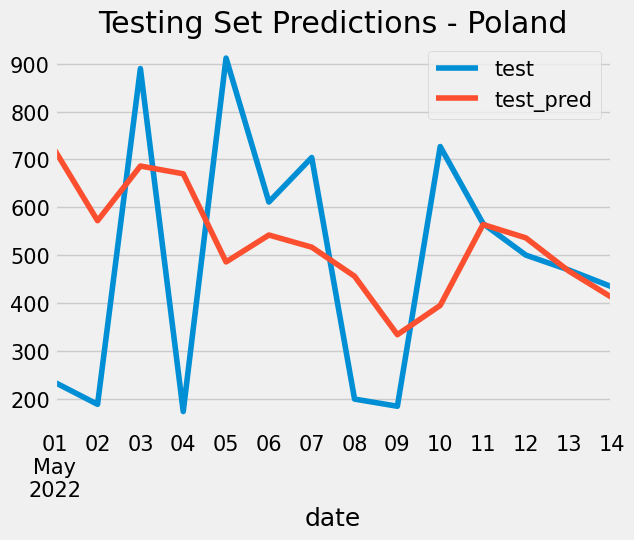

Poland - Train RMSE: 1231.5416446510292
Poland - Test RMSE: 279.5270513093959


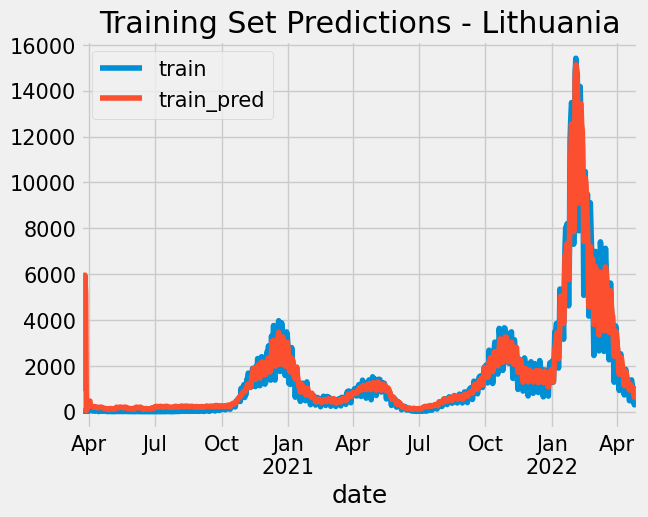

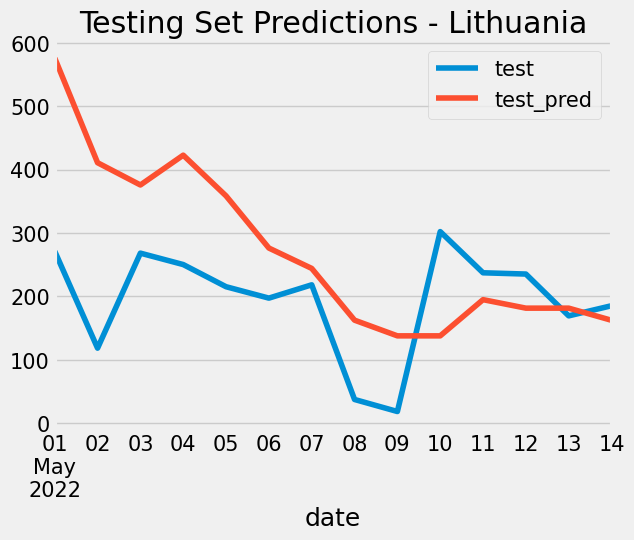

Lithuania - Train RMSE: 529.8001687366284
Lithuania - Test RMSE: 148.80722696507024


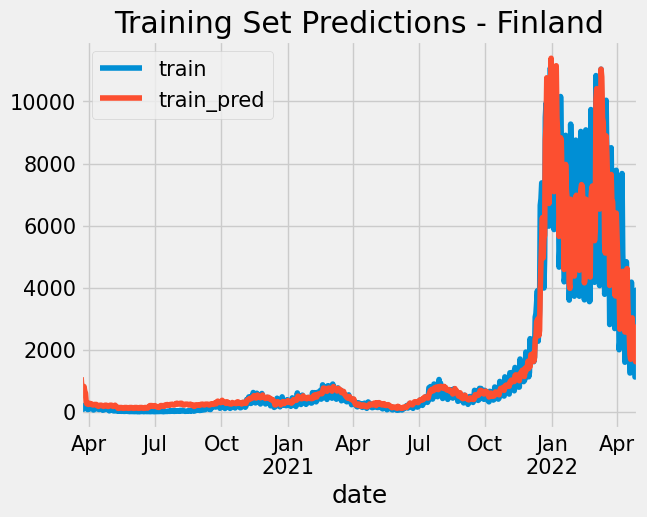

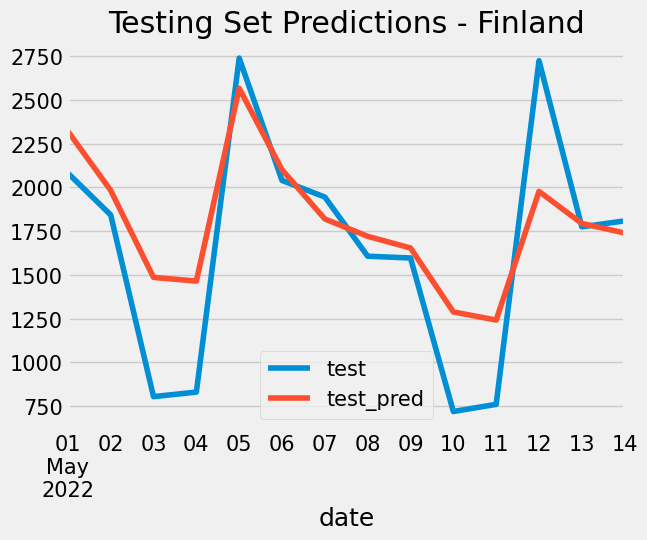

Finland - Train RMSE: 491.4418152111666
Finland - Test RMSE: 389.6803125976961


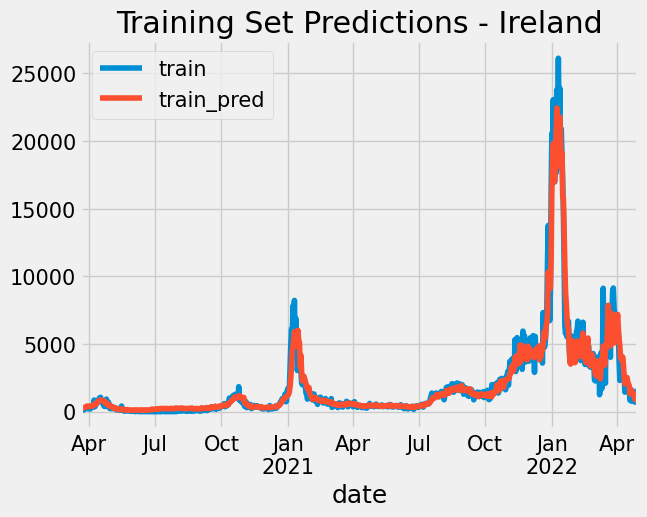

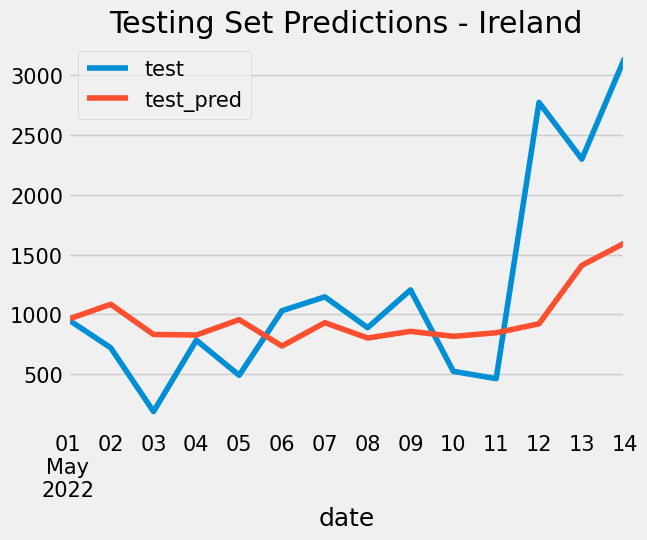

Ireland - Train RMSE: 726.465596668974
Ireland - Test RMSE: 749.809807723966


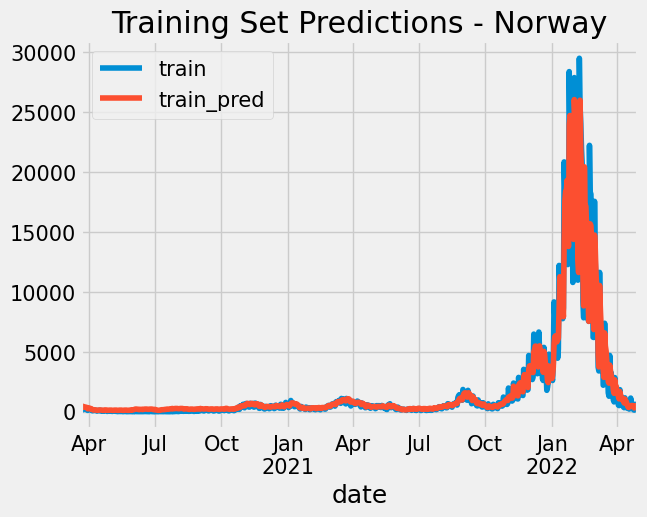

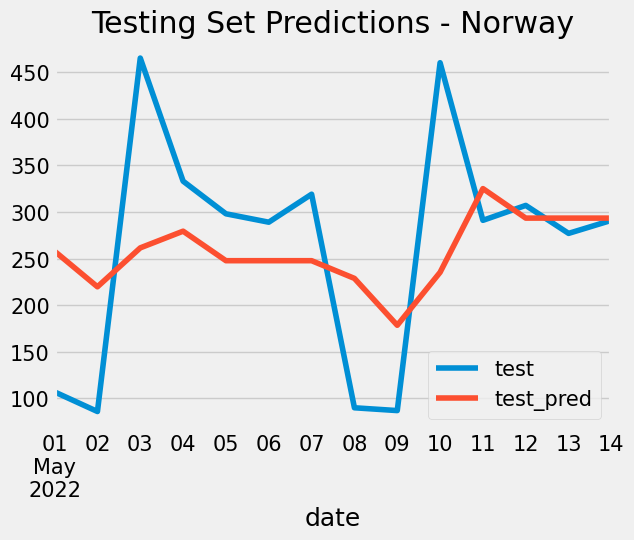

Norway - Train RMSE: 649.4816784857912
Norway - Test RMSE: 111.48836335620591


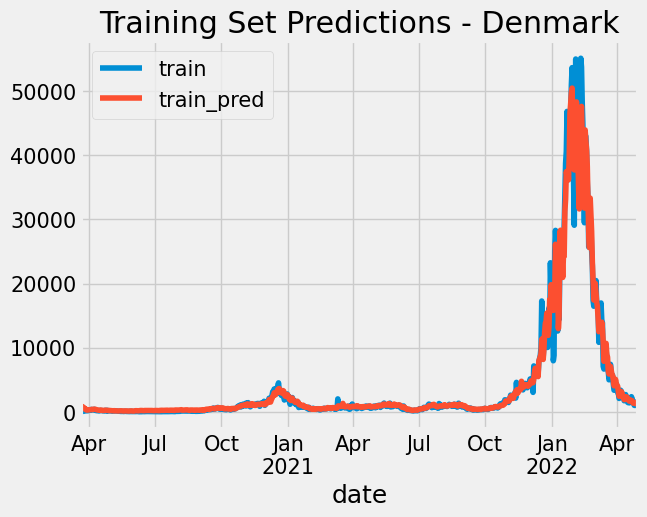

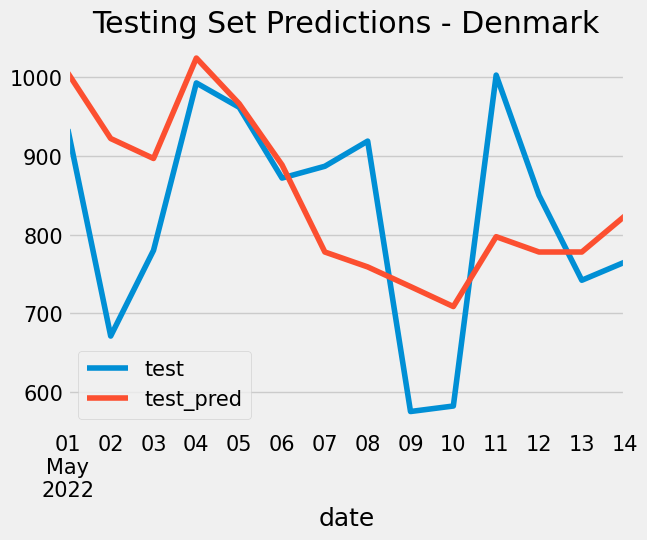

Denmark - Train RMSE: 1288.2569510071733
Denmark - Test RMSE: 123.70452463577384


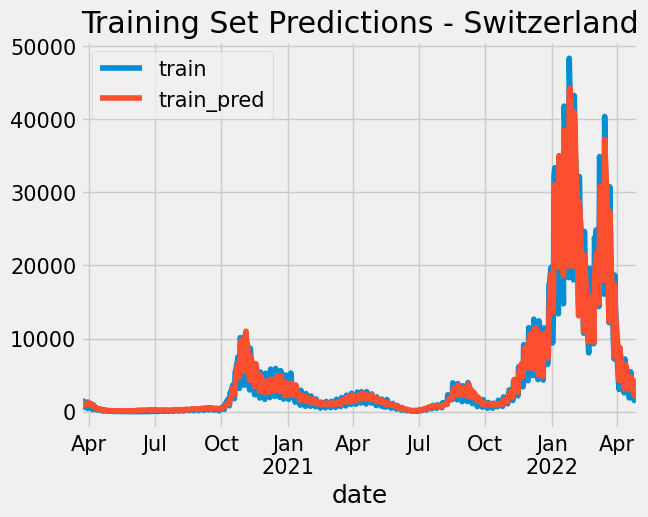

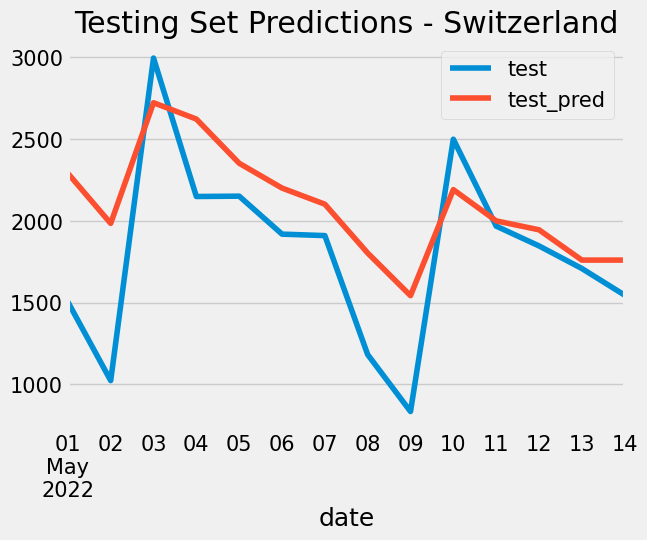

Switzerland - Train RMSE: 1065.0743098633766
Switzerland - Test RMSE: 465.665950796376
                 train_rmse    test_rmse
United Kingdom  2570.437139  1152.837133
Italy           2342.812008  5670.803434
Belgium         1286.531174   813.397810
Poland          1231.541645   279.527051
Lithuania        529.800169   148.807227
Finland          491.441815   389.680313
Ireland          726.465597   749.809808
Norway           649.481678   111.488363
Denmark         1288.256951   123.704525
Switzerland     1065.074310   465.665951


In [ ]:
countries = ['United Kingdom', 'Italy', 'Belgium', 'Poland','Lithuania','Finland', 'Ireland', 'Norway', 'Denmark','Switzerland']
rmse_results = {}

for country in countries:
    location_column = f'location_{country}'

    # train set preds
    train_pred = pd.DataFrame(model4.predict(x_train), columns=['yhat'], index=train.index)
    train_combined = pd.concat([x_train, y_train, train_pred['yhat']], axis=1)
    subset_country_train = train_combined[train_combined[location_column] == 1]

    subset_country_train[['y', 'yhat']].plot()
    plt.title(f'Training Set Predictions - {country}')
    plt.legend(['train', 'train_pred'])
    plt.show()

    # test set preds
    test_pred = pd.DataFrame(model4.predict(x_test), columns=['yhat'], index=test.index)
    test_combined = pd.concat([x_test, y_test, test_pred['yhat']], axis=1)
    subset_country_test = test_combined[test_combined[location_column] == 1]

    subset_country_test[['y', 'yhat']].plot()
    plt.title(f'Testing Set Predictions - {country}')
    plt.legend(['test', 'test_pred'])
    plt.show()

    # Calculate and print RMSE for training and testing sets
    train_rmse = sqrt(mean_squared_error(subset_country_train['y'], subset_country_train['yhat']))
    test_rmse = sqrt(mean_squared_error(subset_country_test['y'], subset_country_test['yhat']))
    rmse_results[country] = {'train_rmse': train_rmse, 'test_rmse': test_rmse}
    
    print(f'{country} - Train RMSE: {train_rmse}')
    print(f'{country} - Test RMSE: {test_rmse}')
    
rmse_df = pd.DataFrame(rmse_results).T
print(rmse_df)

### LSTM Performance

/var/folders/n4/3g40sf9n163fj3t1fbrvlns40000gn/T/ipykernel_36372/2665011155.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  country_data[country].drop('location', axis=1, inplace=True)
/var/folders/n4/3g40sf9n163fj3t1fbrvlns40000gn/T/ipykernel_36372/2665011155.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  country_data[country].drop('location', axis=1, inplace=True)
/var/folders/n4/3g40sf9n163fj3t1fbrvlns40000gn/T/ipykernel_36372/2665011155.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-doc

Epoch 1/500
25/25 [==============================] - 5s 44ms/step - loss: 0.6799 - val_loss: 0.2695
Epoch 2/500
25/25 [==============================] - 0s 3ms/step - loss: 0.4250 - val_loss: 0.1808
Epoch 3/500
25/25 [==============================] - 0s 3ms/step - loss: 0.3641 - val_loss: 0.1652
Epoch 4/500
25/25 [==============================] - 0s 3ms/step - loss: 0.2975 - val_loss: 0.1396
Epoch 5/500
25/25 [==============================] - 0s 3ms/step - loss: 0.2979 - val_loss: 0.1221
Epoch 6/500
25/25 [==============================] - 0s 3ms/step - loss: 0.2532 - val_loss: 0.1308
Epoch 7/500
25/25 [==============================] - 0s 3ms/step - loss: 0.2421 - val_loss: 0.1516
Epoch 8/500
25/25 [==============================] - 0s 3ms/step - loss: 0.2318 - val_loss: 0.1334
Epoch 9/500
25/25 [==============================] - 0s 3ms/step - loss: 0.2262 - val_loss: 0.1365
Epoch 10/500
25/25 [==============================] - 0s 3ms/step - loss: 0.2286 - val_loss: 0.1702
Epoch 11

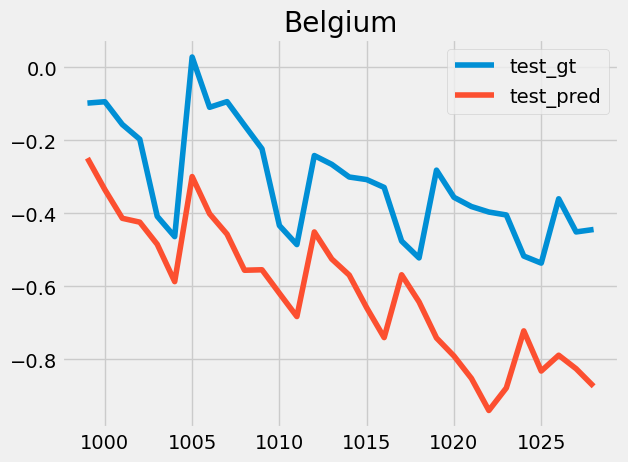

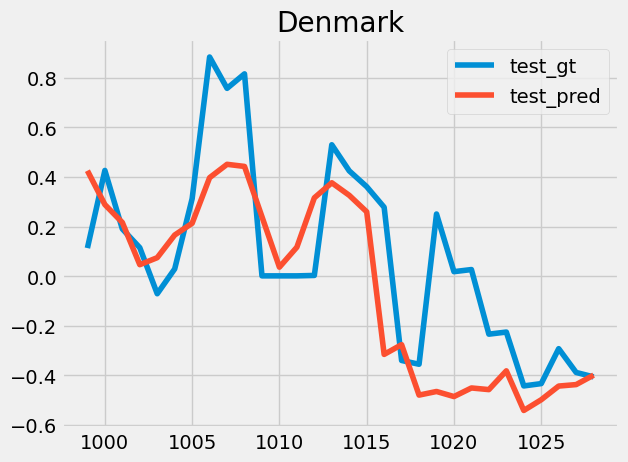

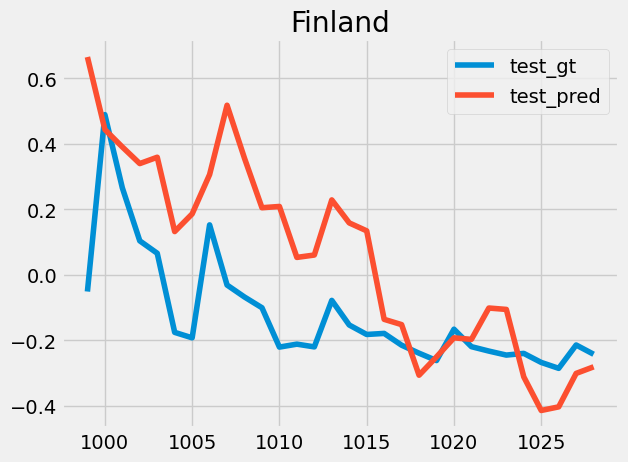

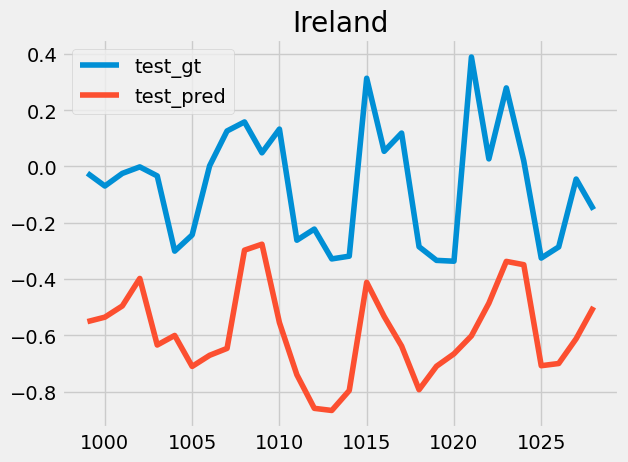

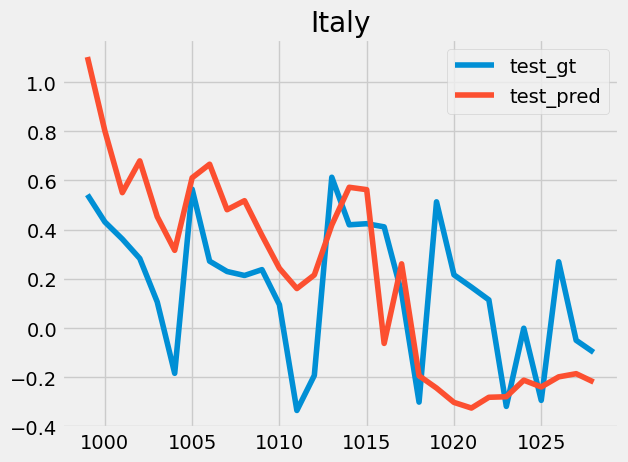

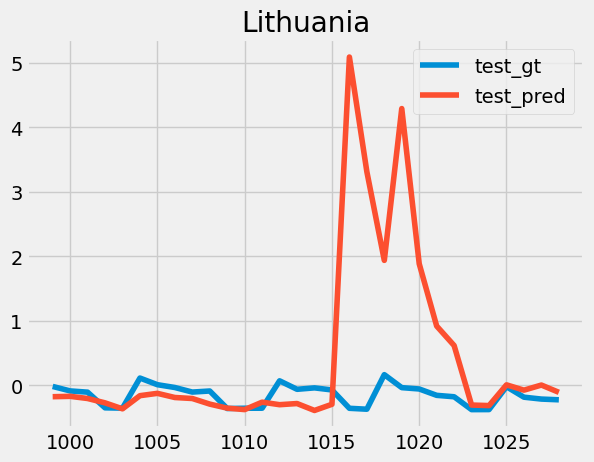

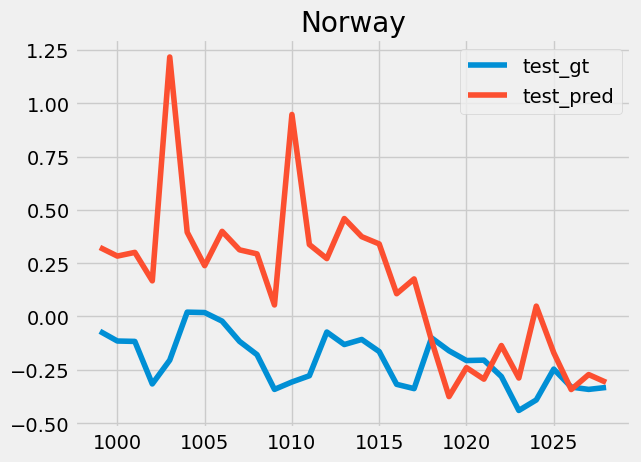

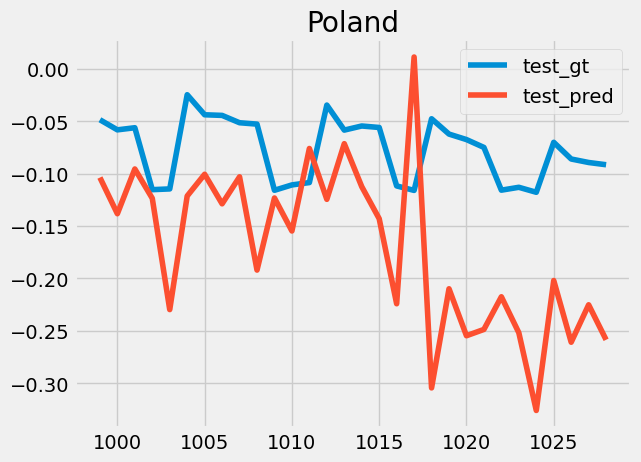

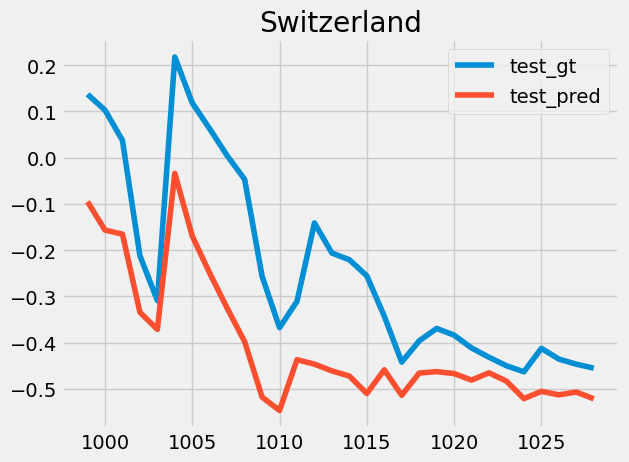

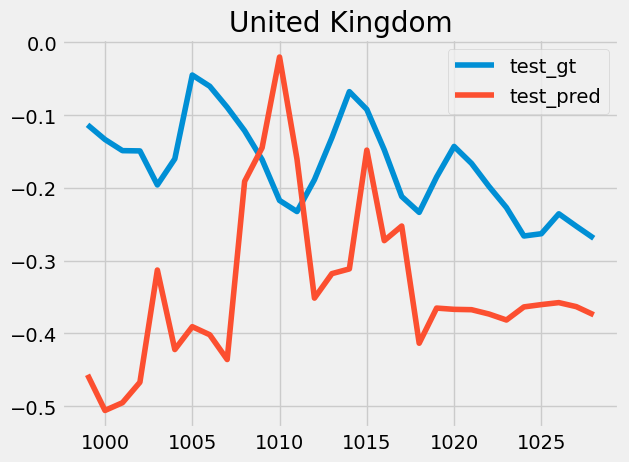

In [ ]:
# make a dictionary of dataframes for each country
country_list = data['location'].unique()

country_data = {}
for country in country_list:
    country_data[country] = data[data['location']==country]
    country_data[country].drop('location', axis=1, inplace=True)
    country_data[country].reset_index(drop=True, inplace=True)

# make series for each country
country_series = {}
for country in country_list:
    country_series[country] = make_series(country_data[country])
    
# train test split for each country
country_train = {}
country_test = {}
for country in country_list:
    country_train[country] = country_series[country][:-30]
    country_test[country] = country_series[country][-30:]

# train model for each country
country_model = {}
for country in country_list:
    x=np.array([x[2].reshape(14,22) for x in country_train[country]])
    y=np.array([x[1] for x in country_train[country]])
    history, model = build_model(x, y, learning_rate=0.01, batch_size=32, n_epochs=500, sequence_length=14, n_units=32, early_stopping_patience=10)
    country_model[country] = model

# make prediction for each country
country_pred = {}
for country in country_list:
    x=np.array([x[2].reshape(14,22) for x in country_test[country]])
    country_pred[country] = country_model[country].predict(x)

# plot prediction for each country
for country in country_list:
    test_pred=pd.DataFrame(country_pred[country], columns=['yhat'], index=[x[0] for x in country_test[country] ])
    test_gt=pd.DataFrame([x[1] for x in country_test[country]], columns=['y'], index=[x[0] for x in country_test[country] ])
    pd.concat([test_gt, test_pred], axis=1).plot()
    plt.legend(['test_gt', 'test_pred'])
    plt.title(country)